# BIRS Biointegration - seqFISH challenge - neighbors aggregation

> My analyses for the [seqFISH challenge](https://github.com/BIRSBiointegration/Hackathon/tree/master/seqFISH) for the [BIRS Biointegration workshop](http://www.birs.ca/videos/2020).

- toc: true
- branch: master
- badges: true
- comments: true
- categories: [spatial analysis, transcriptomics]
- image: images/notebooks/Spatial seqFISH data and detected areas.png
- hide: false

**Objectives:**
- try to map non spatial scRNAseq data to spatial seqFISH data
- find the minimum number of genes required for this mapping
- investigate on whether there are some signatures in non spatial scRNAseq data about the spatial organisation of cells

## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
from time import time
import copy

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV
from scipy.stats import loguniform

import umap
# if not installed run: conda install -c conda-forge umap-learn
import hdbscan
from sklearn.cluster import OPTICS, cluster_optics_dbscan

In [2]:
# Convenient IPython console
# comment it if you execute lupyterlab on a remote server

# %qtconsole

In [3]:
data_dir = Path("../data/raw/tasic_scRNAseq/")
scRNAseq_path = data_dir / "tasic_training_b2.txt"
seqFISH_path = data_dir / "seqfish_cortex_b2_testing.txt"
scRNAseq_labels_path = data_dir / "tasic_labels.tsv"
seqFISH_labels_path = data_dir / "seqfish_labels.tsv"
seqFISH_coords_path = data_dir / "fcortex.coordinates.txt"

### scRNAseq data

txt file of normalized scRNAseq data for `113 genes x 1723 cells`

In [4]:
scRNAseq = pd.read_csv(scRNAseq_path, sep='\t', header=None, index_col=0)
scRNAseq.index.name= 'genes'
scRNAseq = scRNAseq.transpose()
scRNAseq.index.name = 'cells'
scRNAseq.head()

genes,abca15,abca9,acta2,adcy4,aldh3b2,amigo2,ankle1,ano7,anxa9,arhgef26,...,spag6,sumf2,tbr1,tnfrsf1b,vmn1r65,vps13c,wrn,zfp182,zfp715,zfp90
cells,,,,,,,,,,,,,,,,,,,,,
1,11.0,22.0,15.0,12.0,27.0,23.0,29.0,11.0,15.0,59.0,...,42.0,42.0,39.0,28.0,59.0,32.0,40.0,51.0,40.0,72.0
2,42.0,46.0,47.0,45.0,49.0,43.0,46.0,42.0,48.0,43.0,...,45.0,59.0,41.0,66.0,39.0,31.0,43.0,43.0,41.0,49.0
3,17.0,22.0,15.0,12.0,27.0,101.0,72.0,16.0,15.0,75.0,...,42.0,67.0,41.0,19.0,52.0,38.0,40.0,53.0,41.0,73.0
4,42.0,46.0,42.0,45.0,49.0,43.0,37.0,42.0,42.0,43.0,...,48.0,39.0,43.0,64.0,22.0,34.0,47.0,80.0,43.0,49.0
5,35.0,39.0,34.0,38.0,42.0,72.0,61.0,34.0,33.0,36.0,...,45.0,33.0,41.0,34.0,23.0,34.0,45.0,43.0,41.0,46.0


### seqFISH data

txt file of normalized seqFISH data for `113 genes x 1597 cells`

In [5]:
seqFISH = pd.read_csv(seqFISH_path, sep='\t', header=None, index_col=0)
seqFISH.index.name= 'genes'
seqFISH = seqFISH.transpose()
seqFISH.index.name = 'cells'
seqFISH.head()

genes,abca15,abca9,acta2,adcy4,aldh3b2,amigo2,ankle1,ano7,anxa9,arhgef26,...,spag6,sumf2,tbr1,tnfrsf1b,vmn1r65,vps13c,wrn,zfp182,zfp715,zfp90
cells,,,,,,,,,,,,,,,,,,,,,
1,68.0,41.0,25.0,39.0,101.0,93.0,41.0,44.0,53.0,38.0,...,41.0,36.0,101.0,61.0,38.0,63.0,36.0,97.0,32.0,35.0
2,49.0,42.0,23.0,54.0,47.0,64.0,42.0,68.0,40.0,40.0,...,101.0,36.0,101.0,42.0,39.0,31.0,38.0,35.0,33.0,35.0
3,50.0,38.0,16.0,37.0,41.0,93.0,76.0,50.0,43.0,42.0,...,39.0,46.0,101.0,33.0,54.0,43.0,31.0,36.0,86.0,46.0
4,39.0,36.0,21.0,18.0,52.0,93.0,40.0,48.0,39.0,45.0,...,39.0,33.0,101.0,49.0,60.0,34.0,51.0,36.0,18.0,37.0
5,31.0,47.0,29.0,37.0,101.0,93.0,46.0,50.0,31.0,46.0,...,62.0,0.0,101.0,28.0,51.0,47.0,24.0,26.0,35.0,40.0


### scRNAseq labels

tsv file of cell type labels for scRNAseq

In [6]:
scRNAseq_labels = pd.read_csv(scRNAseq_labels_path, sep='\t', header=None)
scRNAseq_labels.head()

,0,1,2
0,Astrocyte,Calb2_tdTpositive_cell_46,upper
1,Astrocyte,Calb2_tdTpositive_cell_48,upper
2,Astrocyte,Calb2_tdTpositive_cell_50,lower
3,Astrocyte,Calb2_tdTpositive_cell_53,lower
4,Astrocyte,Calb2_tdTpositive_cell_58,lower


In [7]:
counts = scRNAseq_labels.groupby(0)[0].value_counts()
counts.index = counts.index.droplevel()
counts.index.name = 'phenotype'
counts

phenotype
Astrocyte                43
Endothelial Cell         29
GABA-ergic Neuron       761
Glutamatergic Neuron    812
Microglia                22
Oligodendrocyte.1        19
Oligodendrocyte.2         6
Oligodendrocyte.3        31
Name: 0, dtype: int64

Tha classes are higly imbalanced.

#### label re-encoding

In [8]:
# we transform Tasic's phenotypes from strings to integers
# for their visualization on projections

from sklearn import preprocessing
le = preprocessing.LabelEncoder()
phenotypes = list(scRNAseq_labels.iloc[:,0].unique())
le.fit(phenotypes)

y_true = le.transform(scRNAseq_labels.iloc[:,0])

# colors of data points according to their phenotypes
colors = [sns.color_palette()[x] for x in y_true]

### seqFISH labels

tsv file of cell type labels for seqFISH

In [9]:
seqFISH_labels = pd.read_csv(seqFISH_labels_path, sep='\t', header=None)
seqFISH_labels.head()

,0,1,2,3,4,5
0,1,5,Glutamatergic Neuron,3,-,0.982793
1,2,5,Glutamatergic Neuron,3,-,0.944590
2,3,5,Glutamatergic Neuron,3,-,0.829923
3,4,5,Glutamatergic Neuron,3,-,0.465946
4,5,5,Glutamatergic Neuron,3,-,0.986380


In [10]:
seqFISH_counts = seqFISH_labels.groupby(2)[2].value_counts()
seqFISH_counts.index = seqFISH_counts.index.droplevel()
seqFISH_counts.index.name = 'phenotype'
seqFISH_counts

phenotype
Astrocyte                97
Endothelial Cell         11
GABA-ergic Neuron       556
Glutamatergic Neuron    859
Microglia                22
Oligodendrocyte.1         8
Oligodendrocyte.2        21
Oligodendrocyte.3        23
Name: 2, dtype: int64

### seqFISH coordinates

Spatial cell coordinates

In [11]:
seqFISH_coords = pd.read_csv(seqFISH_coords_path, sep=' ', header=None, usecols=[2,3], names=['x','y'])
seqFISH_coords.head()

,x,y
0,265.76,-231.14
1,290.48,-261.52
2,257.12,-133.35
3,753.46,-261.14
4,700.01,-169.05


## Exploratory Data Analysis

### Gene expression statistics

#### Separate statistics

In [12]:
scRNAseq_stats = scRNAseq.describe().iloc[1:,:] # iloc to skip the `count` statistics
seqFISH_stats = seqFISH.describe().iloc[1:,:] # iloc to skip the `count` statistics
scRNAseq_stats.index.name = 'statistics'
seqFISH_stats.index.name = 'statistics'

Text(0.5, 0.98, 'Summary statistics for scRNAseq data')

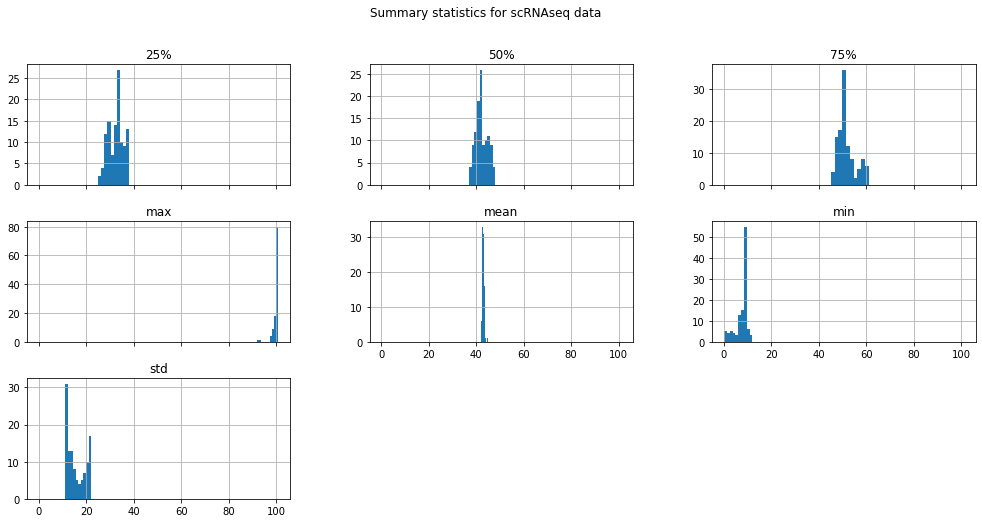

In [13]:
scRNAseq_stats.T.hist(figsize=(17,8), sharex=True)
plt.suptitle('Summary statistics for scRNAseq data')

Text(0.5, 0.98, 'Summary statistics for seqFISH data')

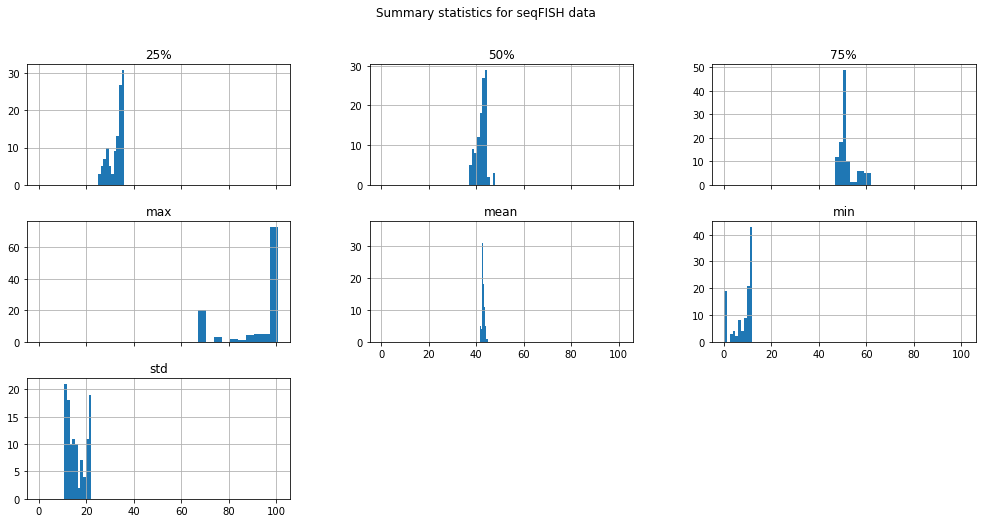

In [14]:
seqFISH_stats.T.hist(figsize=(17,8), sharex=True)
plt.suptitle('Summary statistics for seqFISH data')

So as stated in the documentation of the original BIRS repository, the scRNAseq data and seqFISH data are normalized, we shouldn't need to process them further.  

#### Differences in distributions's statistics

Text(0.5, 0.98, 'Differences in summary statistics')

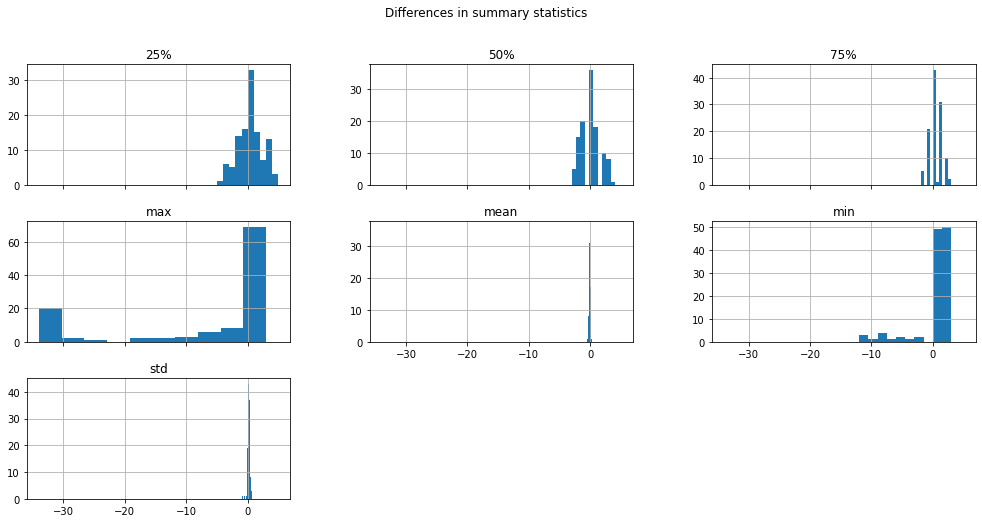

In [15]:
diff_stats = seqFISH_stats - scRNAseq_stats
diff_stats.T.hist(figsize=(17,8), sharex=True)
plt.suptitle('Differences in summary statistics')

The distributions of gene expression data are very comparable between the 2 datasets.  
If we use a standard scaler, does it make them more comparable?

In [16]:
scRNAseq_scaled = StandardScaler().fit_transform(scRNAseq)
seqFISH_scaled = StandardScaler().fit_transform(seqFISH)
# convert it to DataFrame to use convenient methods
gene_names = scRNAseq.columns
scRNAseq_scaled = pd.DataFrame(data=scRNAseq_scaled, columns=gene_names)
seqFISH_scaled = pd.DataFrame(data=seqFISH_scaled, columns=gene_names)
# compute the statistics
scRNAseq_stats_scaled = scRNAseq_scaled.describe().iloc[1:,:] # iloc to skip the `count` statistics
seqFISH_stats_scaled = seqFISH_scaled.describe().iloc[1:,:] # iloc to skip the `count` statistics
scRNAseq_stats_scaled.index.name = 'statistics'
seqFISH_stats_scaled.index.name = 'statistics'

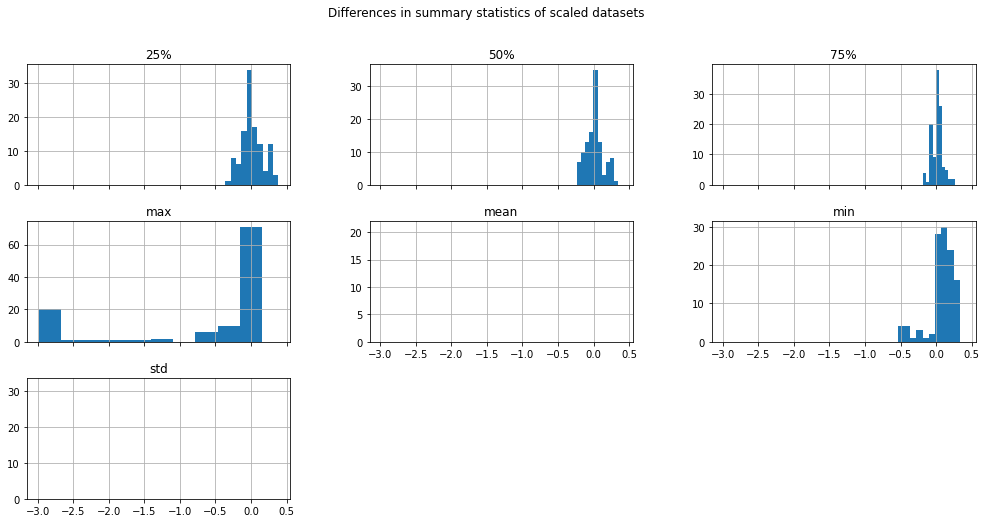

In [17]:
diff_stats_scaled = seqFISH_stats_scaled - scRNAseq_stats_scaled
diff_stats_scaled.T.hist(figsize=(17,8), sharex=True)

plt.suptitle('Differences in summary statistics of scaled datasets');

With a dedicated scaler object for each dataset, their distribution statistics are more comparable.  
We will use dedicated scaler objects to improve the applicability to seqFISH of a classifier trained on scRNAseq.

### Check data transformations with selected genes

In [18]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from scipy.special import expit # the logistic function, the inverse of logit

In [19]:
# for 2 variables we compute different transformations that we store in a list
# choose preferentially variables that have different distribution statistics (outliers, ...)

distributions = []
selected_variables = ['capn13', 'cdc5l', 'cpne5']

for name in selected_variables:

    X = scRNAseq.loc[:,name].values.reshape(-1, 1) + 1 
    X_unitary = MinMaxScaler().fit_transform(X)
    
    distributions.append([
    ('Non transformed data '+name, X),
    ('Data after standard scaling',
        StandardScaler().fit_transform(X)),
    ('Data after min-max scaling',
        MinMaxScaler().fit_transform(X)),
    ('Data after robust scaling',
        RobustScaler(quantile_range=(25, 75)).fit_transform(X)),
    ('Data after quantile transformation (gaussian pdf)',
        QuantileTransformer(output_distribution='normal')
        .fit_transform(X)),
    ('Data after quantile transformation (uniform pdf)',
        QuantileTransformer(output_distribution='uniform')
        .fit_transform(X)),
    ('Data after sample-wise L2 normalizing',   # rescales the vector for each sample to have unit norm, independently of the distribution of the samples.
        Normalizer().fit_transform(X)),
    ('Data after square root transformation',
        np.sqrt((X))),
    ('Data after arcsin sqrt transformation',
        np.arcsin(np.sqrt((X_unitary)))),
    ('Data after power transformation (Yeo-Johnson)',
     PowerTransformer(method='yeo-johnson').fit_transform(X)),
    ('Data after power transformation (Box-Cox)',
     PowerTransformer(method='box-cox').fit_transform(X)),
    ('Data after log transformation (base e)',
        np.log(X)),
    ('Data after centered logistic transformation',
        expit(X-X.mean())),
])

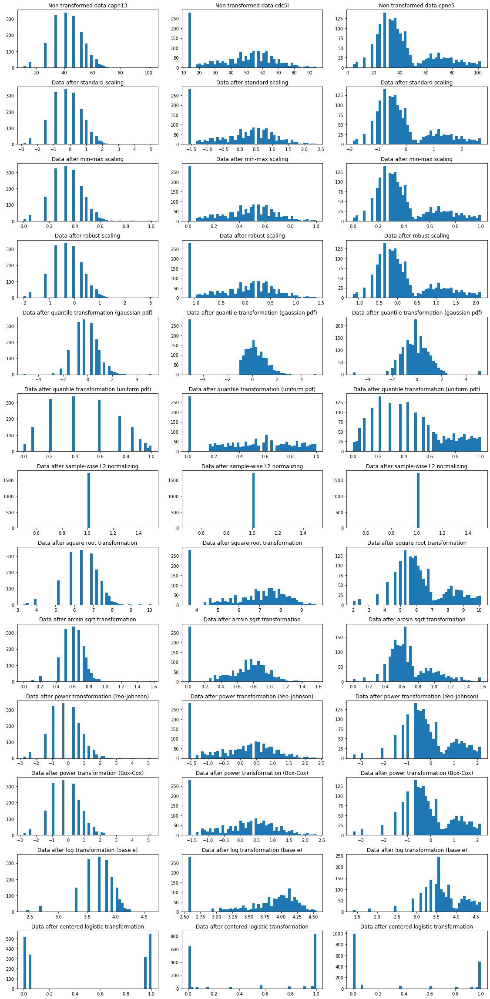

In [20]:
nb_transfo = len(distributions[0])
fig, axes = plt.subplots(nrows=nb_transfo, ncols=len(selected_variables), figsize=plt.figaspect(2)*4)

for j in range(len(selected_variables)):
    one_var_all_transfo = distributions[j]
    for i in range(nb_transfo):
        title, data_transfo = one_var_all_transfo[i]
        bins = 50 # np.ceil(data_transfo.max() - data_transfo.min() + 1).astype(int)
        axes[i,j].hist(data_transfo, bins=bins)
        axes[i,j].set_title(title)
plt.tight_layout()

Here the data were already well transformed, so further transformations degrade the distributions for following tasks llike clustering.  
Usually, on raw data, power-law transformations like Box-Cox or Yeo-Johnson lead to much improved distributions, they deal well with outliers.

### Check data transformations with UMAP projections

#### scRNAseq transformation and projection

In [21]:
X = scRNAseq.values
scRNAseq_projections = [('No transformation ', 
                         umap.UMAP().fit_transform(X)),
                        ('Yeo-Johnson transformation',
                         umap.UMAP().fit_transform(PowerTransformer(method='yeo-johnson').fit_transform(X))),
                        ('Centered logistic transformation',
                         umap.UMAP().fit_transform(expit(X-X.mean())))]

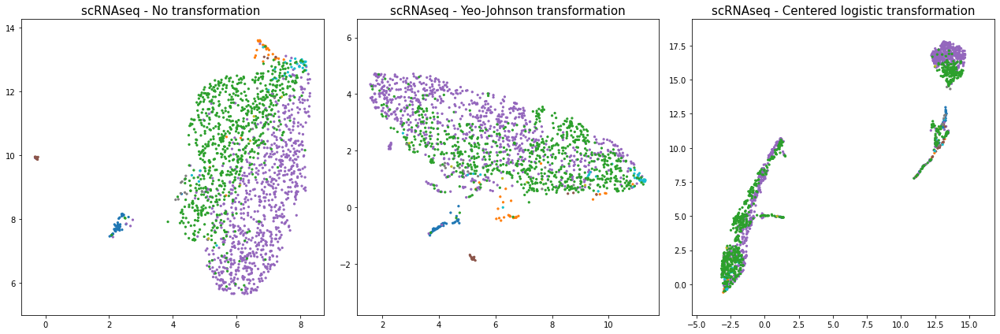

In [22]:
size_points = 5.0
colormap = 'tab10'
marker='o'

nb_transfo = len(scRNAseq_projections)
fig, axes = plt.subplots(nrows=1, ncols=nb_transfo, figsize=(6*nb_transfo,6))

for i in range(nb_transfo):
    transfo_name, projection = scRNAseq_projections[i]
    axes[i].scatter(projection[:, 0], projection[:, 1], c=y_true, cmap=colormap, marker=marker, s=size_points)
    title = 'scRNAseq - ' + transfo_name
    axes[i].set_title(title, fontsize=15)
    axes[i].set_aspect('equal', 'datalim')
plt.tight_layout()
title = 'Check data transformations with UMAP projections'
plt.savefig('../data/processed/'+title, bbox_inches='tight')

On the reduced space of the original data (left figure), the clusterization doesn't seem optimal, some groups are spread among different 'clouds' of points and some points are in the middle of another group.  
The Yeo-Johnson doesn't help much as expected from the previous section.  
The centered logistic transformation outputs 2 clear clusters, but there are certainly artifacts from the transformation. I actually selected this transformation because on the histograms of the selected genes we can see that the centered logistic transformation pushes data into 2 seperate groups.  
But for exploratory analysis for this challenge we stick to the cluster definition of *Tasic et al.*

**Conclusion**  
We will simply work on the data given by the workshop organizers as gene expression data are already well processed.

## Infer scRNAseq-defined cell types from seqFISH data

We train and test the models with the scRNAseq data, assuming Tasic's phenotypes definition is the gold standard.

In [23]:
from multiprocessing import cpu_count

nb_cores = cpu_count()
print(f"There are {nb_cores} available cores")

There are 16 available cores


In [24]:
scaler = StandardScaler()
X = scaler.fit_transform(scRNAseq)

### Test kNN

To test the minimum number of genes required for cell phenotype classification, we try quickly the k-nearest neighbors model.

In [25]:
clf = KNeighborsClassifier(n_neighbors=10)
cv = cross_validate(clf, X, y_true,
                    cv=10,
                    n_jobs=nb_cores-1,
                    scoring=['accuracy', 'balanced_accuracy'])
print(f"Accuracy: {cv['test_accuracy'].mean():0.2f} (+/- {cv['test_accuracy'].std()*2:0.2f})")
print(f"Balanced accuracy: {cv['test_balanced_accuracy'].mean():0.2f} (+/- {cv['test_balanced_accuracy'].std()*2:0.2f})")

/home/alexis/Programs/anaconda3/envs/BIRSBio-seqFISH/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


Accuracy: 0.85 (+/- 0.09)
Balanced accuracy: 0.70 (+/- 0.19)


The performance of kNN is not so good, we test the Support Vector Classifier

### Test SVC

We use the same classifier as in *Zhu et al* for this exploratory anaysis, but ideally we should test a lot of different classifiers with hyperparameter search for each of them.  
In Zhu et al they used `C = 1e−6`, `class_weight = 'balanced'`, `dual = False`, `max_iter = 10,000`, and `tol = 1e−4`  
I just change max_iter to its default -1 (infinite)

In [26]:
clf = SVC(class_weight = 'balanced', tol = 1e-4, C = 1e-6, max_iter = -1)
cv = cross_validate(clf, X, y_true,
                    cv=10,
                    n_jobs=nb_cores-1,
                    scoring=['accuracy', 'balanced_accuracy'])
print(f"Accuracy: {cv['test_accuracy'].mean():0.2f} (+/- {cv['test_accuracy'].std()*2:0.2f})")
print(f"Balanced accuracy: {cv['test_balanced_accuracy'].mean():0.2f} (+/- {cv['test_balanced_accuracy'].std()*2:0.2f})")

/home/alexis/Programs/anaconda3/envs/BIRSBio-seqFISH/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


Accuracy: 0.23 (+/- 0.45)
Balanced accuracy: 0.10 (+/- 0.10)


With Zhu's parameters the model is very bad, but they actually used `LinearSVC`!

In [27]:
clf = LinearSVC(class_weight="balanced", dual=False, C = 1e-6, max_iter=10000, tol=1e-4)
cv = cross_validate(clf, X, y_true,
                    cv=10,
                    n_jobs=nb_cores-1,
                    scoring=['accuracy', 'balanced_accuracy'])
print(f"Accuracy: {cv['test_accuracy'].mean():0.2f} (+/- {cv['test_accuracy'].std()*2:0.2f})")
print(f"Balanced accuracy: {cv['test_balanced_accuracy'].mean():0.2f} (+/- {cv['test_balanced_accuracy'].std()*2:0.2f})")

Accuracy: 0.57 (+/- 0.19)
Balanced accuracy: 0.57 (+/- 0.18)


/home/alexis/Programs/anaconda3/envs/BIRSBio-seqFISH/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


it's a bit better

In [28]:
clf = SVC(class_weight = 'balanced')
cv = cross_validate(clf, X, y_true,
                    cv=10,
                    n_jobs=nb_cores-1,
                    scoring=['accuracy', 'balanced_accuracy'])
print(f"Accuracy: {cv['test_accuracy'].mean():0.2f} (+/- {cv['test_accuracy'].std()*2:0.2f})")
print(f"Balanced accuracy: {cv['test_balanced_accuracy'].mean():0.2f} (+/- {cv['test_balanced_accuracy'].std()*2:0.2f})")

/home/alexis/Programs/anaconda3/envs/BIRSBio-seqFISH/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


Accuracy: 0.90 (+/- 0.06)
Balanced accuracy: 0.80 (+/- 0.22)


Kernel SVC with defaults parameters it's much better.

In [29]:
clf = LinearSVC(class_weight="balanced", dual=False)
cv = cross_validate(clf, X, y_true,
                    cv=10,
                    n_jobs=nb_cores-1,
                    scoring=['accuracy', 'balanced_accuracy'])
print(f"Accuracy: {cv['test_accuracy'].mean():0.2f} (+/- {cv['test_accuracy'].std()*2:0.2f})")
print(f"Balanced accuracy: {cv['test_balanced_accuracy'].mean():0.2f} (+/- {cv['test_balanced_accuracy'].std()*2:0.2f})")

/home/alexis/Programs/anaconda3/envs/BIRSBio-seqFISH/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


Accuracy: 0.91 (+/- 0.06)
Balanced accuracy: 0.77 (+/- 0.22)


Linear SVC with default parameters is better than with Zhu's, but not than kernel SVC.

### Find optimal hyperparameters for kernel SVC

In [30]:
# Utility function to report best hyperparameters sets
def report(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})"
                  .format(results['mean_test_score'][candidate],
                          results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

# Utility function to report best hyperparameters sets with multiple scores
def report_multiple(results, n_top=3, scores=['balanced_accuracy','accuracy']):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_'+scores[0]] == i)
        for candidate in candidates:
            for score in scores:
                rank = results['rank_test_'+score][candidate]
                score_mean = results['mean_test_'+score][candidate]
                score_std = results['std_test_'+score][candidate]
                params = results['params'][candidate]
                print(f"Model with {score} rank: {rank}")
                print(f"Mean {score} validation score: {score_mean:1.3f} (std: {score_std:1.3f})")
            print(f"Parameters: {params}")
            print("")

import json

# Utility function to save best hyperparameters sets
def summary_cv(results, n_top=20):
    summary = []
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            model = {'rank': i,
                     'mean validation score': results['mean_test_score'][candidate],
                     'std validation score': results['std_test_score'][candidate],
                     'parameters': results['params'][candidate]
                    }
            summary.append(model)
    return summary

# Utility function to save best hyperparameters sets with multiple scores
def cv_to_df(cv, scores, order_by=None, ascending=False):
    """
    Converts the result of a cross-validation randomized search from a dictionnary to a dataframe.
    
    Parameters
    ----------
    cv : dict
        The object output by scikit-learn RandomizedSearchCV
    scores: list(str)
        A list of metrics
    order_by: str, list(str), optional
        Single or list of scores (or ranks) used for ordering the dataframe 
    ascending: bool
        How to order the dataframe, default False
    
    Returns
    -------
    df : dataframe
        Results of the RandomizedSearchCV
    
    Examples
    --------
    >>> cv_to_df(random_search.cv_results_, scores=['balanced_accuracy','accuracy'], order_by='mean balanced_accuracy')
    """
    
    scores=['balanced_accuracy','accuracy']
    df = pd.DataFrame(cv['params'])
    for score in scores:
        for stat in ['rank', 'mean', 'std']:
            col = stat + '_test_' + score
            new_col = stat + ' ' + score
            df = df.join(pd.DataFrame(cv[col], columns=[new_col]))
    
    if order_by is not None:
        df.sort_values(by=order_by, ascending=ascending, inplace=True)
        
    return df

In [19]:
# # LONG runtime

# clf = SVC(class_weight = 'balanced')

# # specify parameters and distributions to sample from
# param_dist = {'C': loguniform(1e-8, 1e4),
#               'gamma': loguniform(1e-8, 1e4)}

# # run randomized search
# n_iter_search = 4000
# random_search = RandomizedSearchCV(clf, param_distributions=param_dist,
#                                    n_iter=n_iter_search,
#                                    n_jobs=nb_cores-1,
#                                    scoring=['accuracy', 'balanced_accuracy'],
#                                    refit='balanced_accuracy',
#                                    random_state=0)

# start = time.time()
# random_search.fit(X, y_true)
# end = time.time()
# print("RandomizedSearchCV took %.2f seconds for %d candidates"
#       " parameter settings." % ((end - start), n_iter_search))

# report_multiple(random_search.cv_results_)

# t = time.localtime()
# timestamp = time.strftime('%Y-%m-%d_%Hh%M', t)

# cv_search= cv_to_df(random_search.cv_results_, scores=['balanced_accuracy','accuracy'], order_by='mean balanced_accuracy')
# cv_search.to_csv(f'../data/processed/random_search_cv_results-{timestamp}.csv', index=False)

RandomizedSearchCV took 1279.63 seconds for 4000 candidates parameter settings.
Model with balanced_accuracy rank: 1
Mean balanced_accuracy validation score: 0.802 (std: 0.099)
Model with accuracy rank: 494
Mean accuracy validation score: 0.748 (std: 0.057)
Parameters: {'C': 620.136695767719, 'gamma': 6.174154575760377e-07}

Model with balanced_accuracy rank: 2
Mean balanced_accuracy validation score: 0.800 (std: 0.100)
Model with accuracy rank: 497
Mean accuracy validation score: 0.743 (std: 0.060)
Parameters: {'C': 2.739909237312122, 'gamma': 0.00013577469000752856}

Model with balanced_accuracy rank: 3
Mean balanced_accuracy validation score: 0.800 (std: 0.099)
Model with accuracy rank: 499
Mean accuracy validation score: 0.740 (std: 0.060)
Parameters: {'C': 1215.7850626257866, 'gamma': 3.0160695172570545e-07}



#### Map of hyperparameters scores

In [49]:
def hyperparam_map(results, param_x, param_y, score, n_top = 20, best_scores_coeff=500,
                   figsize = (10,10), best_cmap=sns.light_palette("green", as_cmap=True)):
    """
    Plot the score of a cross-validation randomized search.
    
    Parameters
    ----------
    results : dataframe
        Results of a scikit-learn RandomizedSearchCV
    param_x: str
        The hyperparameter on the x axis
    param_y: str
        The hyperparameter on the y axis
    score: str
        The evaluation metrics
    n_top: int
        Number of best hyperparmeters combinations to highlight, default 20
    best_scores_coeff: int or float
        Coefficient to tweak points size
    figsize: tuple(int, int)
        Size ofthe figure
    best_cmap: matplotlib colormap
        Colormap for the best hyperparameters combinations
    
    Examples
    --------
    >>> cv_search = pd.read_csv('../data/processed/random_search_cv_results-2020-05-09_09h50.csv')
    >>> hyperparam_map(cv_search, param_x = 'C', param_y = 'gamma', score = 'mean balanced_accuracy', n_top = 20, figsize = (10,10))
    """

    plt.figure(figsize=figsize)
    ax = sns.scatterplot(x=param_x, y=param_y, hue=score, size=score, data=results)
    ax.set_xscale('log')
    ax.set_yscale('log')

    best = results.sort_values(by=score, ascending=False).iloc[:n_top,:]
    best_scores = best[score] - best[score].min()
    best_scores = best_scores / best_scores.max()

    ax.scatter(x=best[param_x], y=best[param_y], c=best_scores, s=best_scores*best_scores_coeff, marker='+', cmap=best_cmap)
    ax.scatter(x=best[param_x].iloc[0], y=best[param_y].iloc[0], s=best_scores.iloc[0]*best_scores_coeff/2, marker='o', color='r', alpha=0.5)

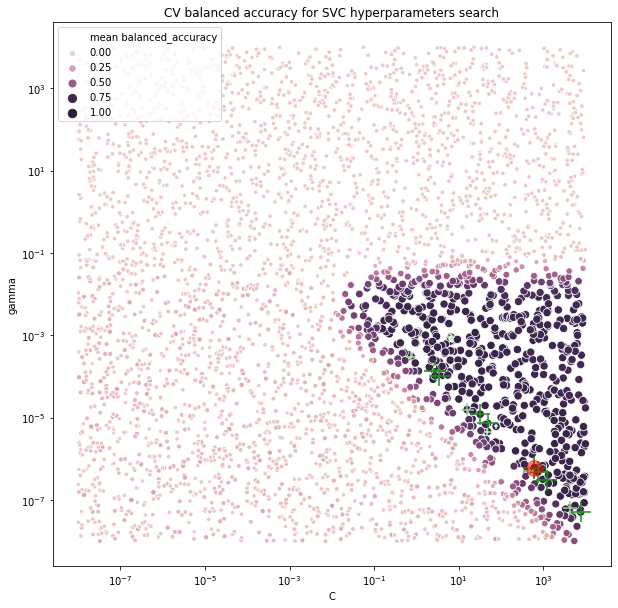

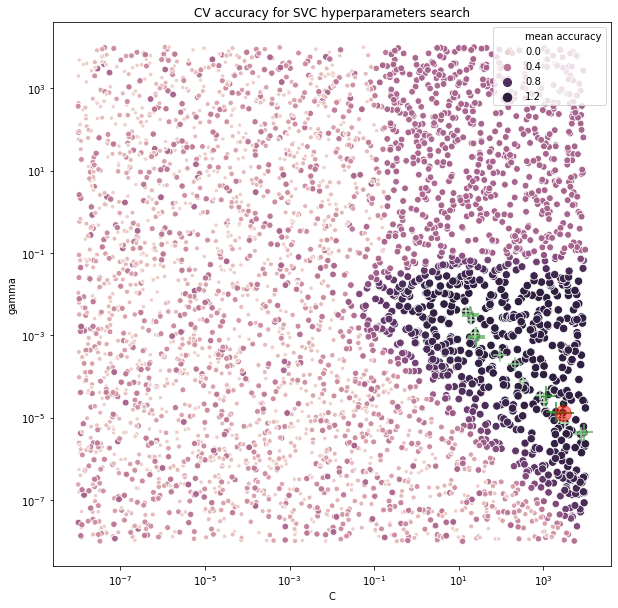

In [50]:
cv_search = pd.read_csv('../data/processed/random_search_cv_results-2020-05-09_09h50.csv')

hyperparam_map(cv_search, param_x = 'C', param_y = 'gamma', score = 'mean balanced_accuracy', n_top = 20, figsize = (10,10))
title = 'CV balanced accuracy for SVC hyperparameters search'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')
hyperparam_map(cv_search, param_x = 'C', param_y = 'gamma', score = 'mean accuracy', n_top = 20, figsize = (10,10))
title = 'CV accuracy for SVC hyperparameters search'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')

#### Zoomed hyperparameters search

In [27]:
# # LONG runtime
# clf = SVC(class_weight = 'balanced')

# # specify parameters and distributions to sample from
# param_dist = {'C': loguniform(1e-2, 1e4),
#               'gamma': loguniform(1e-8, 1e-1)}

# # run randomized search
# n_iter_search = 2000
# random_search_zoom = RandomizedSearchCV(clf, param_distributions=param_dist,
#                                    n_iter=n_iter_search,
#                                    n_jobs=nb_cores-1,
#                                    scoring=['accuracy', 'balanced_accuracy'],
#                                    refit='balanced_accuracy',
#                                    random_state=0)

# start = time.time()
# random_search_zoom.fit(X, y_true)
# end = time.time()
# print("RandomizedSearchCV took %.2f seconds for %d candidates"
#       " parameter settings." % ((end - start), n_iter_search))

# report_multiple(random_search_zoom.cv_results_)

# t = time.localtime()
# timestamp = time.strftime('%Y-%m-%d_%Hh%M', t)
# cv_search_zoom= cv_to_df(random_search_zoom.cv_results_, scores=['balanced_accuracy','accuracy'], order_by='mean balanced_accuracy')
# cv_search_zoom.to_csv(f'../data/processed/random_search_cv_zoom_results-{timestamp}.csv', index=False)

RandomizedSearchCV took 495.26 seconds for 2000 candidates parameter settings.
Model with balanced_accuracy rank: 1
Mean balanced_accuracy validation score: 0.803 (std: 0.100)
Model with accuracy rank: 811
Mean accuracy validation score: 0.751 (std: 0.057)
Parameters: {'C': 34.95523887154205, 'gamma': 1.1187184066079642e-05}

Model with balanced_accuracy rank: 2
Mean balanced_accuracy validation score: 0.801 (std: 0.099)
Model with accuracy rank: 818
Mean accuracy validation score: 0.745 (std: 0.060)
Parameters: {'C': 37.766494965393214, 'gamma': 1.0038490009792895e-05}

Model with balanced_accuracy rank: 3
Mean balanced_accuracy validation score: 0.801 (std: 0.100)
Model with accuracy rank: 820
Mean accuracy validation score: 0.745 (std: 0.059)
Parameters: {'C': 61.747076862969834, 'gamma': 6.152080255621994e-06}



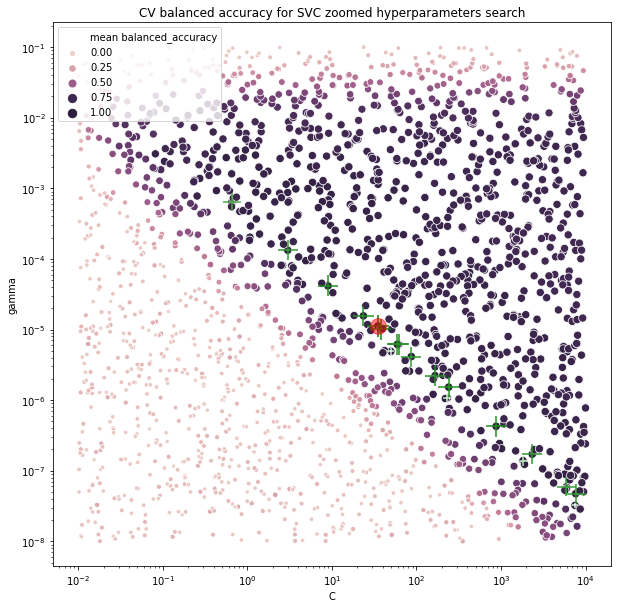

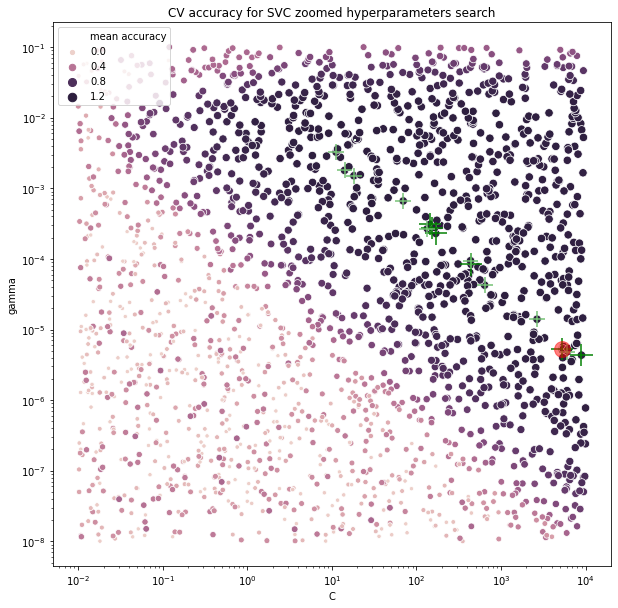

In [52]:
cv_search_zoom = pd.read_csv('../data/processed/random_search_cv_zoom_results-2020-05-09_09h50.csv')

hyperparam_map(cv_search_zoom, param_x = 'C', param_y = 'gamma', score = 'mean balanced_accuracy', n_top = 20, figsize = (10,10))
title = 'CV balanced accuracy for SVC zoomed hyperparameters search'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')
hyperparam_map(cv_search_zoom, param_x = 'C', param_y = 'gamma', score = 'mean accuracy', n_top = 20, figsize = (10,10))
title = 'CV accuracy for SVC zoomed hyperparameters search'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')

Best hyperparameters are higher for simple accuracy than for balanced accuracy

### Find optimal hyperparameters for Linear SVC

In [138]:
# # LONG runtime

# clf = LinearSVC(class_weight="balanced", dual=False, max_iter=10000)

# # specify parameters and distributions to sample from
# nb_candidates = 600
# param_grid = {'C': np.logspace(start=-8, stop=4, num=nb_candidates, endpoint=True, base=10.0)}

# # run grid search
# grid_search = GridSearchCV(clf,
#                            param_grid=param_grid,
#                            n_jobs=nb_cores-1,
#                            scoring=['accuracy', 'balanced_accuracy'],
#                            refit='balanced_accuracy')

# start = time.time()
# grid_search.fit(X, y_true)
# end = time.time()
# print("GridSearchCV took %.2f seconds for %d candidates"
#       " parameter settings." % ((end - start), nb_candidates))

# report_multiple(grid_search.cv_results_)

# t = time.localtime()
# timestamp = time.strftime('%Y-%m-%d_%Hh%M', t)

# cv_search = cv_to_df(grid_search.cv_results_, scores=['balanced_accuracy','accuracy'], order_by='mean balanced_accuracy')
# cv_search.to_csv(f'../data/processed/grid_search_cv_results-{timestamp}.csv', index=False)

GridSearchCV took 584.93 seconds for 600 candidates parameter settings.
Model with balanced_accuracy rank: 1
Mean balanced_accuracy validation score: 0.780 (std: 0.048)
Model with accuracy rank: 263
Mean accuracy validation score: 0.882 (std: 0.020)
Parameters: {'C': 0.0008876608757158817}

Model with balanced_accuracy rank: 2
Mean balanced_accuracy validation score: 0.780 (std: 0.047)
Model with accuracy rank: 299
Mean accuracy validation score: 0.882 (std: 0.020)
Parameters: {'C': 0.0008476443849811126}

Model with balanced_accuracy rank: 3
Mean balanced_accuracy validation score: 0.779 (std: 0.042)
Model with accuracy rank: 149
Mean accuracy validation score: 0.887 (std: 0.017)
Parameters: {'C': 0.0011179284880487525}



#### Line hyperparameters scores

In [53]:
def hyperparam_line(df, param_x, scores, figsize=(10,5), log_scale=True, legend=True):
    """
    Plot the score of a 1D cross-validation grid search.
    
    Parameters
    ----------
    df : dataframe
        Results of a scikit-learn GridSearchCV
    param_x: str
        The hyperparameter on the x axis
    scores: list(str)
        List of evaluation metrics
    figsize: tuple(int, int), default (10,5)
        Size ofthe figure
    log_scale: bool, default True
        If True the x axis is in log scale
    legend: bool, default True
        If True display the legend
    
    Examples
    --------
    >>> cv_search = pd.read_csv('../data/processed/grid_search_cv_results-2020-06-09_18h36.csv')
    >>> hyperparam_line(cv_search, param_x='C', scores = ['mean balanced_accuracy', 'mean accuracy'])
    """
    
    plt.figure(figsize=figsize)
    for score in scores:
        ax = sns.lineplot(x=param_x, y=score, data=df, label=score)
    if log_scale:
        ax.set_xscale('log')
    if legend:
        plt.legend()

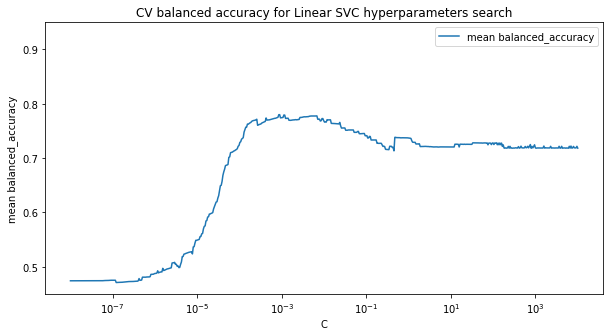

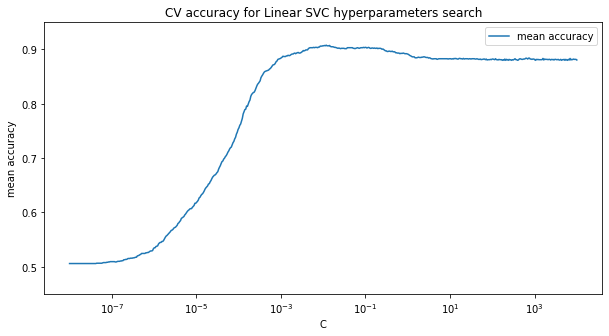

In [54]:
cv_search = pd.read_csv('../data/processed/grid_search_cv_results-2020-06-09_18h36.csv')

hyperparam_line(cv_search, param_x = 'C', scores = ['mean balanced_accuracy'], figsize = (10,5))
plt.ylim([0.45,0.95])
title = 'CV balanced accuracy for Linear SVC hyperparameters search'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')
hyperparam_line(cv_search, param_x = 'C', scores = ['mean accuracy'], figsize = (10,5))
plt.ylim([0.45,0.95])
title = 'CV accuracy for Linear SVC hyperparameters search'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')

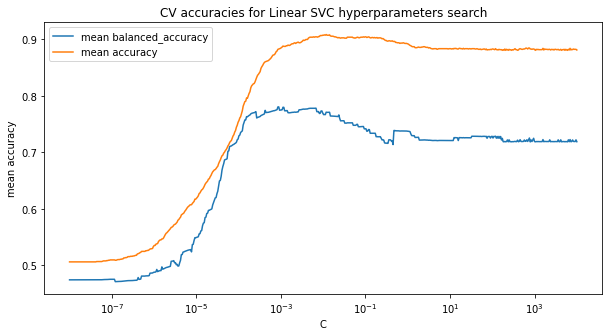

In [55]:
cv_search = pd.read_csv('../data/processed/grid_search_cv_results-2020-06-09_18h36.csv')

hyperparam_line(cv_search, param_x='C', scores = ['mean balanced_accuracy', 'mean accuracy'])
title = 'CV accuracies for Linear SVC hyperparameters search'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')

With LinearSVC as in Zhu's paper we can reach an accuracy of 0.9 too, but a balanced accuracy of 0.78 only.  
We will stick to our kernel SVC as the balanced accuracy is a bit higher.

## Top-down elimination of variables

In [56]:
from multiprocessing import cpu_count
from dask.distributed import Client
from dask import delayed

nb_cores = cpu_count()
print(f"There are {nb_cores} available cores")

client = Client(n_workers=nb_cores-1)

There are 16 available cores


/home/alexis/Programs/anaconda3/envs/BIRSBio-seqFISH/lib/python3.7/site-packages/distributed/node.py:155: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 43555 instead
  http_address["port"], self.http_server.port


### For kernel SVC

In [ ]:
# If you want to run the LONG top-dpwn elimination of variables, uncomment and run this:

# # cross_val_score because now we only look at balanced_accuracy
# from sklearn.model_selection import cross_val_score

# # if you have run the parameter search in the 2nd previous cell
# # C = random_search_zoom.best_params_['C']
# # gamma = random_search_zoom.best_params_['gamma']
# # or if you need to load search results previously saved:
# param_search = pd.read_csv('../data/processed/random_search_cv_zoom_results-2020-05-09_09h50.csv')
# scoring = 'balanced-accuracy'
# best = param_search.loc[param_search['rank '+scoring]==1]
# C = best['C'].values[0]
# gamma = best['gamma'].values[0]
# # clf = SVC(C=9.32, gamma=0.0157) # old value

# clf = SVC(C = C, gamma = gamma, class_weight = 'balanced') 
# Xelim = np.copy(X) # the X data that will be pruned

# elimination_report = []

# def score_leaveoneout(clf, y_true, Xelim, var, scoring):
#     Xtest = np.delete(Xelim, var, axis=1)
#     score = cross_val_score(clf, Xtest, y_true,
#                             cv=5,
#                             n_jobs=5,
#                             scoring=scoring).mean()
#     return score

# Nvar = X.shape[1]
# start = time.time()
# for i in range(Nvar-1):
#     print("Removing {} variables".format(i+1), end="    ")
#     scores = []
#     for var in range(Xelim.shape[1]):
#         score = delayed(score_leaveoneout)(clf, y_true, Xelim, var, scoring)
#         scores.append(score)

#     # find the variable that was the less usefull for the model
#     maxi_score = delayed(max)(scores)
#     worst_var = delayed(list.index)(scores, maxi_score)
#     maxi_score = maxi_score.compute()
#     worst_var = worst_var.compute()
#     print("eliminating var n°{}, the score was {:.6f}".format(worst_var, maxi_score))
#     elimination_report.append([worst_var, maxi_score])
#     # eliminate this variable for next round
#     Xelim = np.delete(Xelim, worst_var, axis=1)
    
# end = time.time()
# duration = end-start
# print(f"the computation lasted {duration:.1f}s")
# elimination_report = np.array(elimination_report)
# t = time.localtime()
# timestamp = time.strftime('%Y-%m-%d_%Hh%M', t)
# np.savetxt(f"../data/processed/elimination_report-{scoring}-{timestamp}.csv", 
#            elimination_report,
#            delimiter=',',
#            header='var index, score',
#            comments='',
#            fmt=['%d', '%f'])

#### elimination with balanced accuracy

In [57]:
# If you want to load the data to display them directly, run this:
elimination_report = np.loadtxt("../data/processed/elimination_report-balanced-accuracy-2020-06-09_13h11.csv", skiprows=1, delimiter=',')

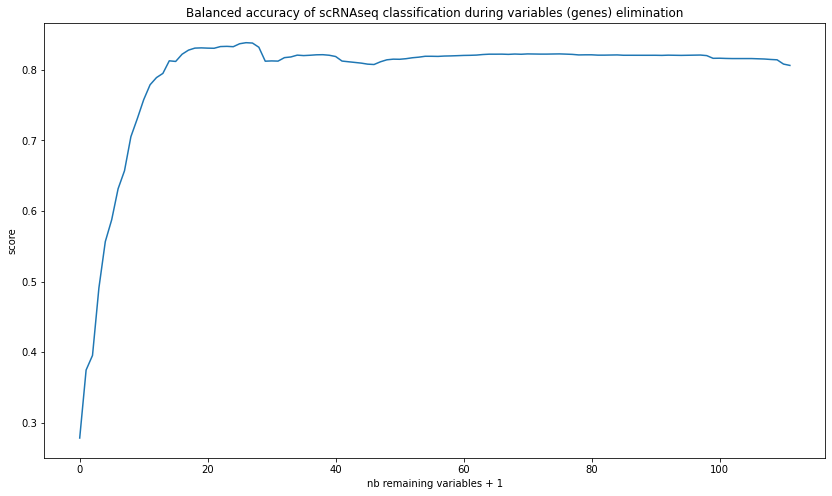

In [58]:
plt.figure(figsize=(14,8))
plt.plot(elimination_report[::-1,1]);
plt.xlabel('nb remaining variables + 1')
plt.ylabel('score')
title = 'Balanced accuracy of scRNAseq classification during variables (genes) elimination'
plt.title(title);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

We can eliminate ~3/4 of genes without a signicative change in the classification performance.  
We even have better performances between 18 and 27 remaining genes.  
It looks like we could keep only last 14 genes and still have a reasonable performance (0.81), the maximum performance being 0.838 when we have 26 genes left.

#### elimination with accuracy

In [42]:
elimination_report = np.loadtxt("../data/processed/elimination_report-accuracy-2020-06-09_15h02.csv", skiprows=1, delimiter=',')

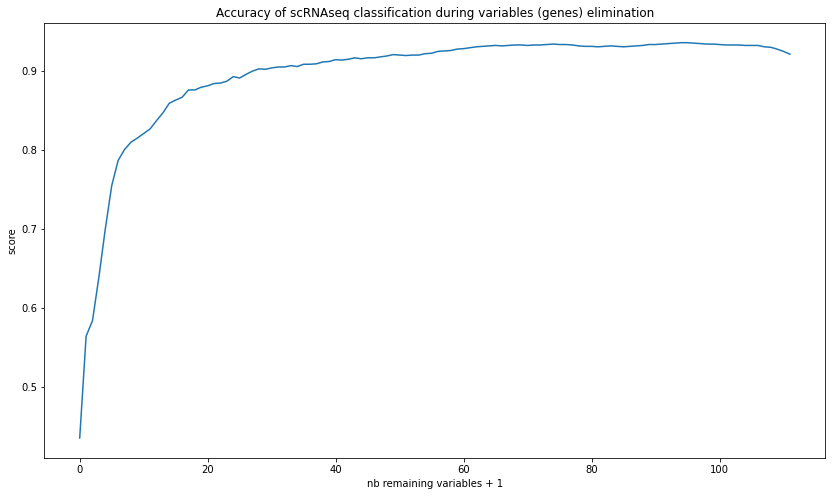

In [125]:
plt.figure(figsize=(14,8))
plt.plot(elimination_report[::-1,1]);
plt.xlabel('nb remaining variables + 1')
plt.ylabel('score')
title = 'Accuracy of scRNAseq classification during variables (genes) elimination'
plt.title(title);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

So there is a clear difference, and it is easy to overestimate the perfomance of the classifier with the wrong metrics

### For linear SVC

From Zhu *et al*:  

The performance was evaluated
by cross-validation. By using only 40 genes, we were able to achieve
an average level of 89% mapping accuracy. Increasing the number
of genes led to better performance (92% for 60 genes and 96% for
80 genes)  
Cross-validation analysis revealed that, using
these 43 genes as input, the SVM model accurately mapped 90.1%
of the cells in the scRNAseq data to the correct cell type. Thus, we
used these 43 genes (Supplementary Table 2) to map cell types in
the seqFISH data.  
We found that 5.5%
cells were excluded, that is, they could not be confidently mapped to
a single cell type (with 0.5 or less probability). Among the mapped
cells, 54% were glutamatergic neurons, 37% were GABAergic neurons,
4.8% were astrocytes, and other glial cell types and endothelial cells
comprised the remaining 4.2% of cells

In [ ]:
# If you want to run the LONG top-dpwn elimination of variables, uncomment and run this:

# # cross_val_score because now we only look at balanced_accuracy
# from sklearn.model_selection import cross_val_score

# # if you have run the parameter search in the 2nd previous cell
# # C = random_search_zoom.best_params_['C']
# # gamma = random_search_zoom.best_params_['gamma']
# # or if you need to load search results previously saved:
# param_search = pd.read_csv('../data/processed/grid_search_cv_results-2020-06-09_18h36.csv')
# scoring = 'accuracy'
# best = param_search.loc[param_search['rank '+scoring]==1]
# C = best['C'].values[0]

# clf = LinearSVC(C=C, class_weight='balanced', dual=False, max_iter=10000)
# Xelim = np.copy(X) # the X data that will be pruned

# elimination_report = []

# def score_leaveoneout(clf, y_true, Xelim, var, scoring):
#     Xtest = np.delete(Xelim, var, axis=1)
#     score = cross_val_score(clf, Xtest, y_true,
#                             cv=5,
#                             n_jobs=5,
#                             scoring=scoring).mean()
#     return score

# Nvar = X.shape[1]
# start = time.time()
# for i in range(Nvar-1):
#     print("Removing {} variables".format(i+1), end="    ")
#     scores = []
#     for var in range(Xelim.shape[1]):
#         score = delayed(score_leaveoneout)(clf, y_true, Xelim, var, scoring)
#         scores.append(score)

#     # find the variable that was the less usefull for the model
#     maxi_score = delayed(max)(scores)
#     worst_var = delayed(list.index)(scores, maxi_score)
#     maxi_score = maxi_score.compute()
#     worst_var = worst_var.compute()
#     print("eliminating var n°{}, the score was {:.6f}".format(worst_var, maxi_score))
#     elimination_report.append([worst_var, maxi_score])
#     # eliminate this variable for next round
#     Xelim = np.delete(Xelim, worst_var, axis=1)
    
# end = time.time()
# duration = end-start
# print(f"the computation lasted {duration:.1f}s")
# elimination_report = np.array(elimination_report)
# t = time.localtime()
# timestamp = time.strftime('%Y-%m-%d_%Hh%M', t)
# np.savetxt(f"../data/processed/elimination_report_linearSVC-{scoring}-{timestamp}.csv",
#            elimination_report,
#            delimiter=',',
#            header='var index, score',
#            comments='',
#            fmt=['%d', '%f'])

#### elimination with balanced accuracy

In [59]:
# If you want to load the data to display them directly, run this:
elimination_report = np.loadtxt("../data/processed/elimination_report_linearSVC-balanced_accuracy-2020-06-09_19h47.csv", skiprows=1, delimiter=',')

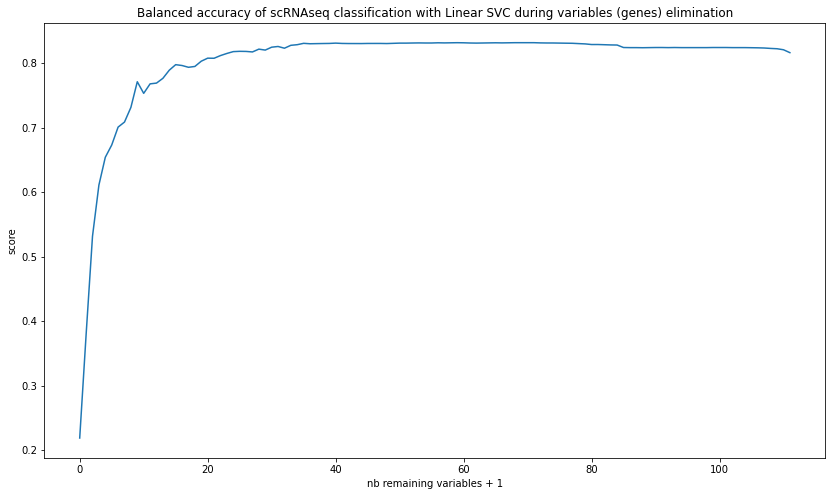

In [60]:
plt.figure(figsize=(14,8))
plt.plot(elimination_report[::-1,1]);
plt.xlabel('nb remaining variables + 1')
plt.ylabel('score')
title = 'Balanced accuracy of scRNAseq classification with Linear SVC during variables (genes) elimination'
plt.title(title);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

#### elimination with accuracy

In [48]:
elimination_report = np.loadtxt("../data/processed/elimination_report_linearSVC-accuracy-2020-06-09_22h30.csv", skiprows=1, delimiter=',')

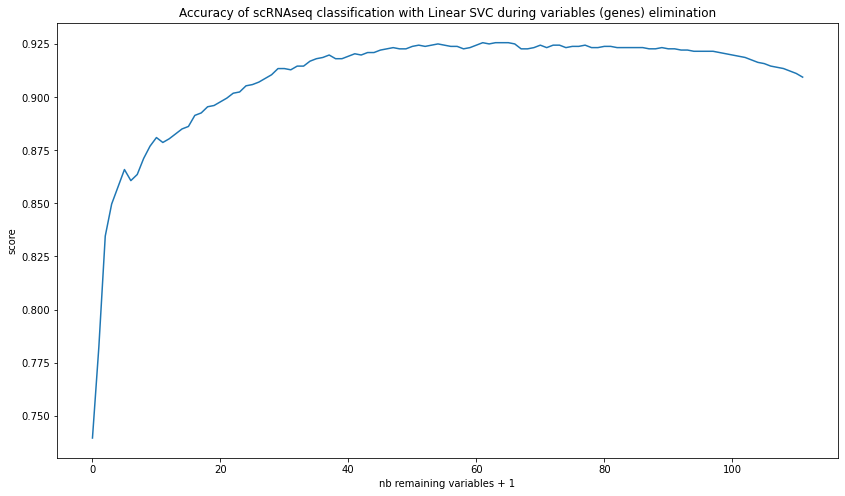

In [49]:
plt.figure(figsize=(14,8))
plt.plot(elimination_report[::-1,1]);
plt.xlabel('nb remaining variables + 1')
plt.ylabel('score')
title = 'Accuracy of scRNAseq classification with Linear SVC during variables (genes) elimination'
plt.title(title);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

These plots confirm that Zhu *et al.* probably used the simple accuracy instead of the balanced accuracy.  
The kernel SVC require fewer genes (\~19-29) than the linear SVC (\~35-39) to maintain a relatively high score.

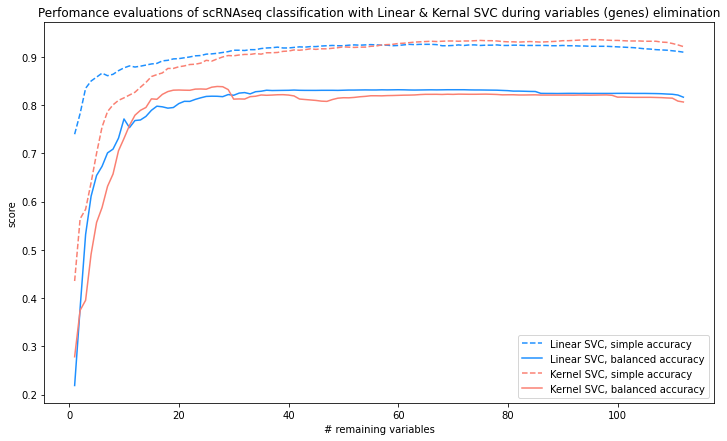

In [61]:
linear_simple_acc = np.loadtxt("../data/processed/elimination_report_linearSVC-accuracy-2020-06-09_22h30.csv", skiprows=1, delimiter=',')
linear_balanced_acc = np.loadtxt("../data/processed/elimination_report_linearSVC-balanced_accuracy-2020-06-09_19h47.csv", skiprows=1, delimiter=',')
kernel_simple_acc = np.loadtxt("../data/processed/elimination_report-accuracy-2020-06-09_15h02.csv", skiprows=1, delimiter=',')
kernel_balanced_acc = np.loadtxt("../data/processed/elimination_report-balanced-accuracy-2020-06-09_13h11.csv", skiprows=1, delimiter=',')
# number of remaining variables
x = np.arange(linear_simple_acc.shape[0]) + 1

plt.figure(figsize=(12,7))
plt.plot(x, linear_simple_acc[::-1,1], label='Linear SVC, simple accuracy', c='dodgerblue', linestyle='dashed');
plt.plot(x, linear_balanced_acc[::-1,1], label='Linear SVC, balanced accuracy', c='dodgerblue', linestyle='solid');
plt.plot(x, kernel_simple_acc[::-1,1], label='Kernel SVC, simple accuracy', c='salmon', linestyle='dashed');
plt.plot(x, kernel_balanced_acc[::-1,1], label='Kernel SVC, balanced accuracy', c='salmon', linestyle='solid');
plt.xlabel('# remaining variables')
plt.ylabel('score')
plt.legend()
title = 'Perfomance evaluations of scRNAseq classification with Linear & Kernal SVC during variables (genes) elimination'
plt.title(title);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

## Infer cell types from restricted gene list

In [13]:
def successive_elimination(list_elems, elems_id):
    """
    Compute the order of discarded elements during 
    successive deletions at indicated indices.
    
    Parameters
    ----------
    list_elems : list
        A list of elements that are eliminated
    elems_id: list
        A list of indices where elements are successively deleted
    
    Returns
    -------
    successive : list
        The ordered list of deleted elements
    
    Examples
    --------
    >>> gene_names = list(scRNAseq.columns)
    >>> order_elim_id = elimination_report[:,0].astype(int)
    >>> order_elim = successive_elimination(gene_names, genes_elim_id)
    """
    
    from copy import deepcopy
    elems = deepcopy(list_elems)
    
    successive = []
    for i in elems_id:
        successive.append(elems.pop(i))
    
    return successive

#### Drop genes

In [14]:
elimination_report = np.loadtxt("../data/processed/elimination_report-balanced-accuracy-2020-06-09_13h11.csv", skiprows=1, delimiter=',')

# Keep the minimum number of genes that lead to good predictions
gene_names = list(scRNAseq.columns)
# nb_elim = 86 # optimal number of genes to discard
nb_elim = 94 # eliminate more genes, with still good performance
order_elim_id = elimination_report[:,0].astype(int)
order_elim = successive_elimination(gene_names, order_elim_id)
genes_elim = order_elim[:nb_elim]

scRNAseq_drop = copy.deepcopy(scRNAseq)
seqFISH_drop = copy.deepcopy(seqFISH)

scRNAseq_drop.drop(columns=genes_elim, inplace=True)
seqFISH_drop.drop(columns=genes_elim, inplace=True)

scaler_sc = StandardScaler()  # for scRNAseq
scaler_seq = StandardScaler() # for seqFISH
Xtest = scaler_sc.fit_transform(scRNAseq_drop)
Xpred = scaler_seq.fit_transform(seqFISH_drop)  
print(f"There are {Xtest.shape[1]} remaining genes")

There are 19 remaining genes


#### Re-run hyperparameters search

In [ ]:
# # LONG runtime

# clf = SVC(class_weight = 'balanced')

# # specify parameters and distributions to sample from
# param_dist = {'C': loguniform(1e-8, 1e4),
#               'gamma': loguniform(1e-8, 1e4)}

# # run randomized search
# n_iter_search = 4000
# random_search = RandomizedSearchCV(clf, param_distributions=param_dist,
#                                    n_iter=n_iter_search,
#                                    n_jobs=nb_cores-1,
#                                    scoring=['accuracy', 'balanced_accuracy'],
#                                    refit='balanced_accuracy',
#                                    random_state=0)

# start = time.time()
# random_search.fit(Xtest, y_true)
# end = time.time()
# print("RandomizedSearchCV took %.2f seconds for %d candidates"
#       " parameter settings." % ((end - start), n_iter_search))

# t = time.localtime()
# timestamp = time.strftime('%Y-%m-%d_%Hh%M', t)
# cv_search= cv_to_df(random_search.cv_results_, scores=['balanced_accuracy','accuracy'], order_by='mean balanced_accuracy')
# cv_search.to_csv(f'../data/processed/random_search_cv_dropped_genes_results-{timestamp}.csv', index=False)

# cv_search.head(10)

#### Map of hyperparameters scores

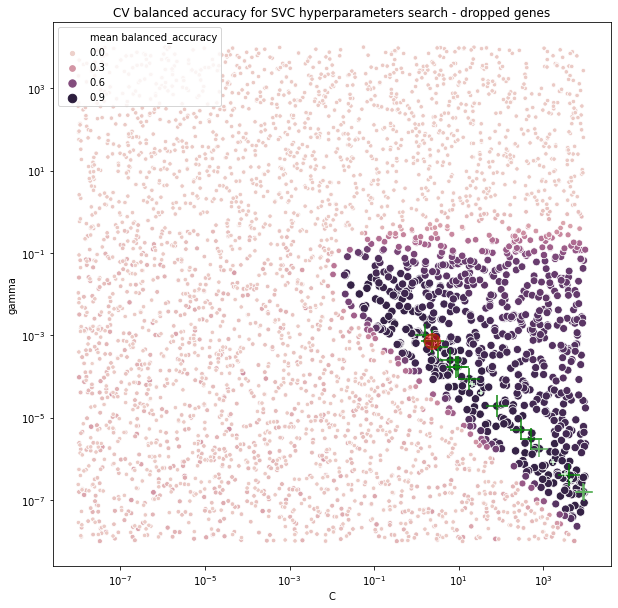

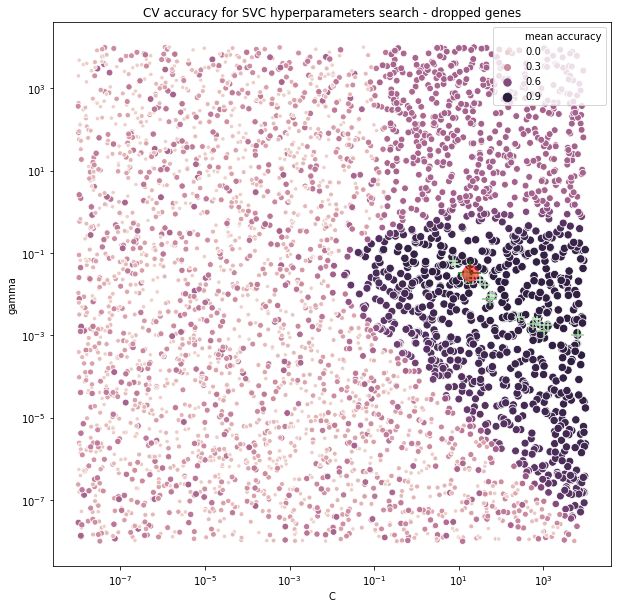

In [65]:
cv_search = pd.read_csv('../data/processed/random_search_cv_dropped_genes_results-2020-06-09_23h13.csv')

hyperparam_map(cv_search, param_x = 'C', param_y = 'gamma', score = 'mean balanced_accuracy', n_top = 20, figsize = (10,10))
title = 'CV balanced accuracy for SVC hyperparameters search - dropped genes'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')
hyperparam_map(cv_search, param_x = 'C', param_y = 'gamma', score = 'mean accuracy', n_top = 20, figsize = (10,10))
title = 'CV accuracy for SVC hyperparameters search - dropped genes'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')

#### Zoomed hyperparameters search

In [65]:
# # LONG runtime

# clf = SVC(class_weight = 'balanced')

# # specify parameters and distributions to sample from
# param_dist = {'C': loguniform(1e-2, 1e4),
#               'gamma': loguniform(1e-8, 1e-1)}

# # run randomized search
# n_iter_search = 2000
# random_search_zoom = RandomizedSearchCV(clf, param_distributions=param_dist,
#                                    n_iter=n_iter_search,
#                                    n_jobs=nb_cores-1,
#                                    scoring=['accuracy', 'balanced_accuracy'],
#                                    refit='balanced_accuracy',
#                                    random_state=0)

# start = time.time()
# random_search_zoom.fit(Xtest, y_true)
# end = time.time()
# print("RandomizedSearchCV took %.2f seconds for %d candidates"
#       " parameter settings." % ((end - start), n_iter_search))

# t = time.localtime()
# timestamp = time.strftime('%Y-%m-%d_%Hh%M', t)
# cv_search_zoom= cv_to_df(random_search_zoom.cv_results_, scores=['balanced_accuracy','accuracy'], order_by='mean balanced_accuracy')
# cv_search_zoom.to_csv(f'../data/processed/random_search_cv_dropped_genes_zoom_results-{timestamp}.csv', index=False)

# cv_search_zoom.head(10)

RandomizedSearchCV took 178.02 seconds for 2000 candidates parameter settings.
Model with balanced_accuracy rank: 1
Mean balanced_accuracy validation score: 0.853 (std: 0.078)
Model with accuracy rank: 801
Mean accuracy validation score: 0.777 (std: 0.026)
Parameters: {'C': 8.775953809786483, 'gamma': 0.00018527006591647559}

Model with balanced_accuracy rank: 1
Mean balanced_accuracy validation score: 0.853 (std: 0.078)
Model with accuracy rank: 801
Mean accuracy validation score: 0.777 (std: 0.026)
Parameters: {'C': 1890.1870009578247, 'gamma': 8.414819504246644e-07}

Model with balanced_accuracy rank: 1
Mean balanced_accuracy validation score: 0.853 (std: 0.078)
Model with accuracy rank: 801
Mean accuracy validation score: 0.777 (std: 0.026)
Parameters: {'C': 3.940758839629906, 'gamma': 0.00041555470680403213}

Model with balanced_accuracy rank: 1
Mean balanced_accuracy validation score: 0.853 (std: 0.078)
Model with accuracy rank: 801
Mean accuracy validation score: 0.777 (std: 0.0

,C,gamma,rank balanced_accuracy,mean balanced_accuracy,std balanced_accuracy,rank accuracy,mean accuracy,std accuracy
1413,161.755087,9.885856e-06,1,0.853161,0.078232,801,0.777133,0.026085
923,8.775954,1.852701e-04,1,0.853161,0.078232,801,0.777133,0.026085
1369,3.940759,4.155547e-04,1,0.853161,0.078232,801,0.777133,0.026085
1164,1890.187001,8.414820e-07,1,0.853161,0.078232,801,0.777133,0.026085
1605,4.034733,4.246600e-04,5,0.853151,0.078249,801,0.777133,0.026085
1684,1.742717,9.038132e-04,6,0.852852,0.078381,806,0.775974,0.025160
447,53.335391,3.070838e-05,7,0.852832,0.078502,807,0.775972,0.027225
1657,7550.684828,2.123328e-07,7,0.852832,0.078502,807,0.775972,0.027225
1940,55.470978,2.985453e-05,7,0.852832,0.078502,807,0.775972,0.027225
1263,4309.929233,3.602585e-07,7,0.852832,0.078502,807,0.775972,0.027225


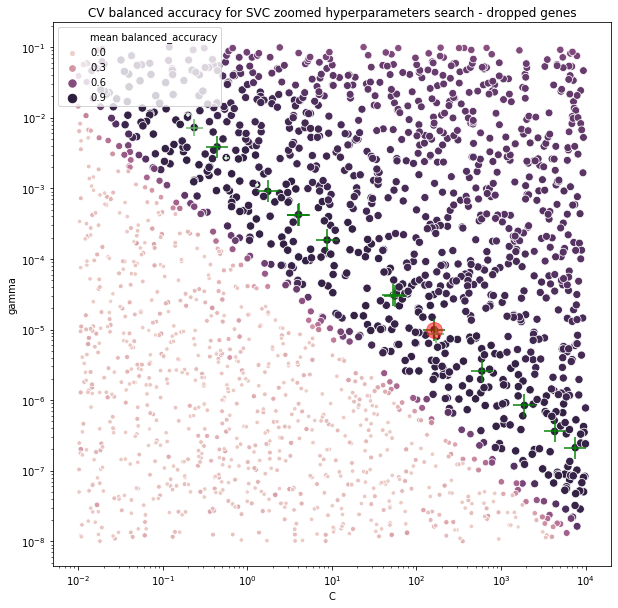

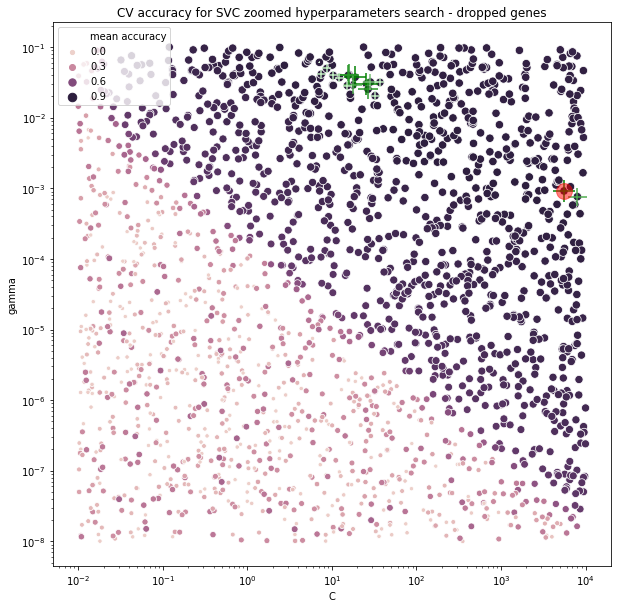

In [66]:
cv_search_zoom = pd.read_csv('../data/processed/random_search_cv_dropped_genes_zoom_results-2020-06-09_23h21.csv')

hyperparam_map(cv_search_zoom, param_x = 'C', param_y = 'gamma', score = 'mean balanced_accuracy', n_top = 20, figsize = (10,10))
title = 'CV balanced accuracy for SVC zoomed hyperparameters search - dropped genes'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')
hyperparam_map(cv_search_zoom, param_x = 'C', param_y = 'gamma', score = 'mean accuracy', n_top = 20, figsize = (10,10))
title = 'CV accuracy for SVC zoomed hyperparameters search - dropped genes'
plt.title(title)
plt.savefig('../data/processed/'+title, bbox_inches='tight')

#### Predict phenotypes of seqFISH cells

In [15]:
param_search = pd.read_csv('../data/processed/random_search_cv_dropped_genes_zoom_results-2020-06-09_23h21.csv')
scoring = 'balanced_accuracy'
best = param_search.loc[param_search['rank '+scoring]==1]
C = best['C'].values[0]
gamma = best['gamma'].values[0]

clf = SVC(C=C, gamma=gamma, class_weight='balanced')
clf.fit(Xtest, y_true)
y_pred = clf.predict(Xpred)

In [16]:
pheno_id, counts = np.unique(y_pred, return_counts=True)
pheno_names = le.inverse_transform(pheno_id)
pd.DataFrame(data={'phenotype':pheno_names,
                   'counts':counts},
             index=pheno_id)

,phenotype,counts
0,Astrocyte,87
1,Endothelial Cell,19
2,GABA-ergic Neuron,699
3,Glutamatergic Neuron,654
4,Microglia,31
5,Oligodendrocyte.1,29
6,Oligodendrocyte.2,46
7,Oligodendrocyte.3,32


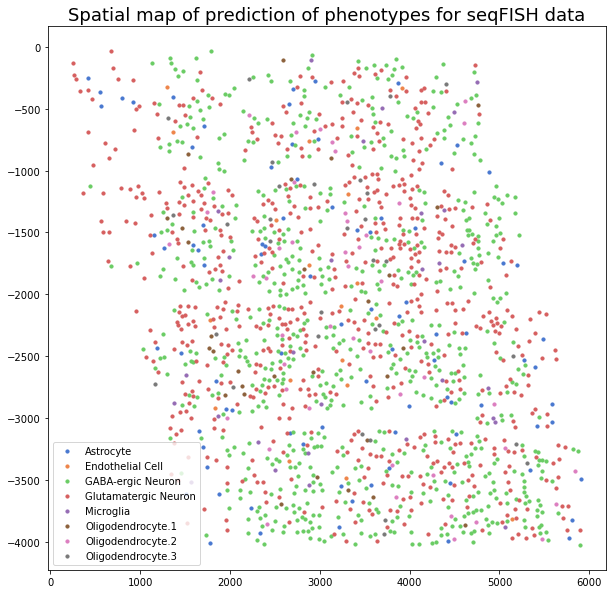

In [17]:
base_cmap = sns.color_palette('muted').as_hex() # plt.get_cmap("Set1")

# make a custom colormap with class integers, labels and hex colors like
# [[0, 'Astrocyte', '#023eff'],
#  [2, 'GABA-ergic Neuron', '#ff7c00'],
#  [3, 'Glutamatergic Neuron', '#1ac938']]
# 
color_labels = []
for i, i_pred in enumerate(np.unique(y_pred)):
    color_labels.append([i_pred, le.inverse_transform([i_pred])[0], base_cmap[i]])

# more custom colormap, switch to previous line if any issue like different class integers
# color_labels = [[0, le.inverse_transform([0])[0], base_cmap[0]],
#                 [2, le.inverse_transform([2])[0], base_cmap[1]],
#                 [3, le.inverse_transform([3])[0], base_cmap[2]]]

fig, ax = plt.subplots(figsize=[10,10])
for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax.scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=10)
plt.legend()

title = 'Spatial map of prediction of phenotypes for seqFISH data'
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

## Spatial analysis

The main idea is to reconstruct the spatial network of cells, where nodes are cells and edges link neighboring cells.  
We will use this network to analyse how neighboring cells (linked nodes) can define a spacially coherent area.

### Network reconstruction

We use Voronoi tessellation to define the edges that link neighboring cells.  
Voroinoi tessellation defines virtual cell boundaries, and we link cells that share boundaries.

In [18]:
from scipy.spatial import Voronoi

vor = Voronoi(seqFISH_coords[['x','y']])

# arrays of x0, y0, x1, y1
voro_cells = np.zeros((vor.ridge_points.shape[0],4))
voro_cells[:,[0,1]] = seqFISH_coords.loc[vor.ridge_points[:,0], ['x','y']]
voro_cells[:,[2,3]] = seqFISH_coords.loc[vor.ridge_points[:,1], ['x','y']]
distances = np.sqrt((voro_cells[:,0]-voro_cells[:,2])**2+(voro_cells[:,1]-voro_cells[:,3])**2)

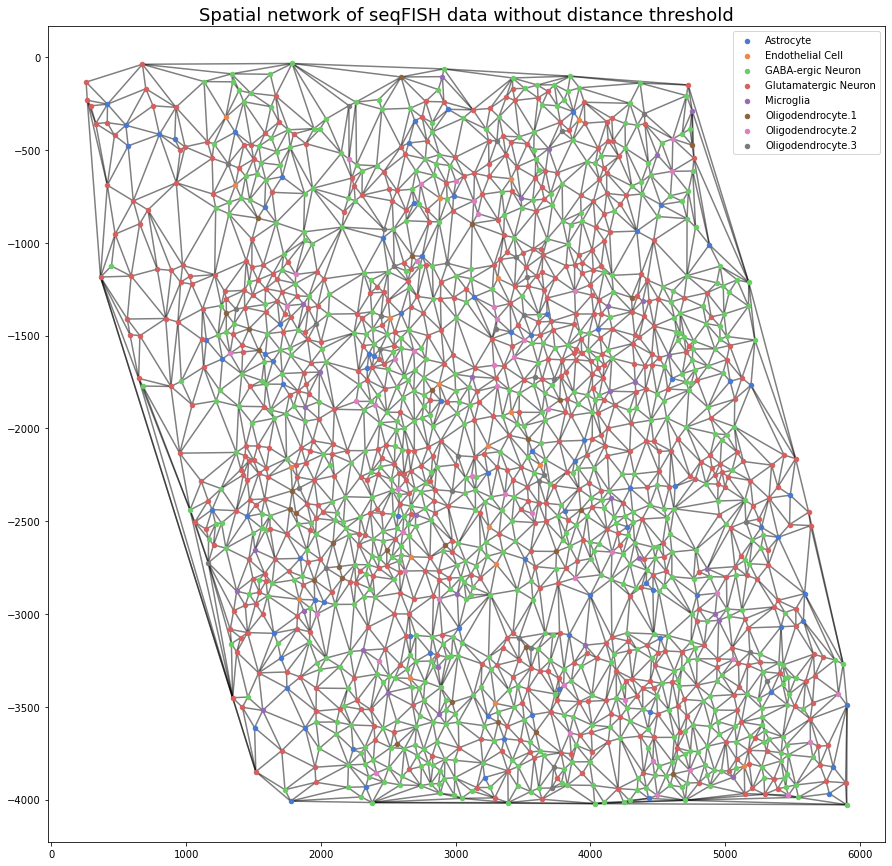

In [35]:
fig, ax = plt.subplots(figsize=[15, 15])
for points in voro_cells[:,:]:
    ax.plot(points[[0,2]],points[[1,3]], c='k',zorder=0, alpha=0.5)
for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax.scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=20, zorder=10)
plt.legend()

title = 'Spatial network of seqFISH data without distance threshold'
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

There are many edges that connect nodes on the border of the network, it's only due to Voronoi tessellation and limit conditions.  
We need to cut edges that link nodes that are more distant than a given threshold.

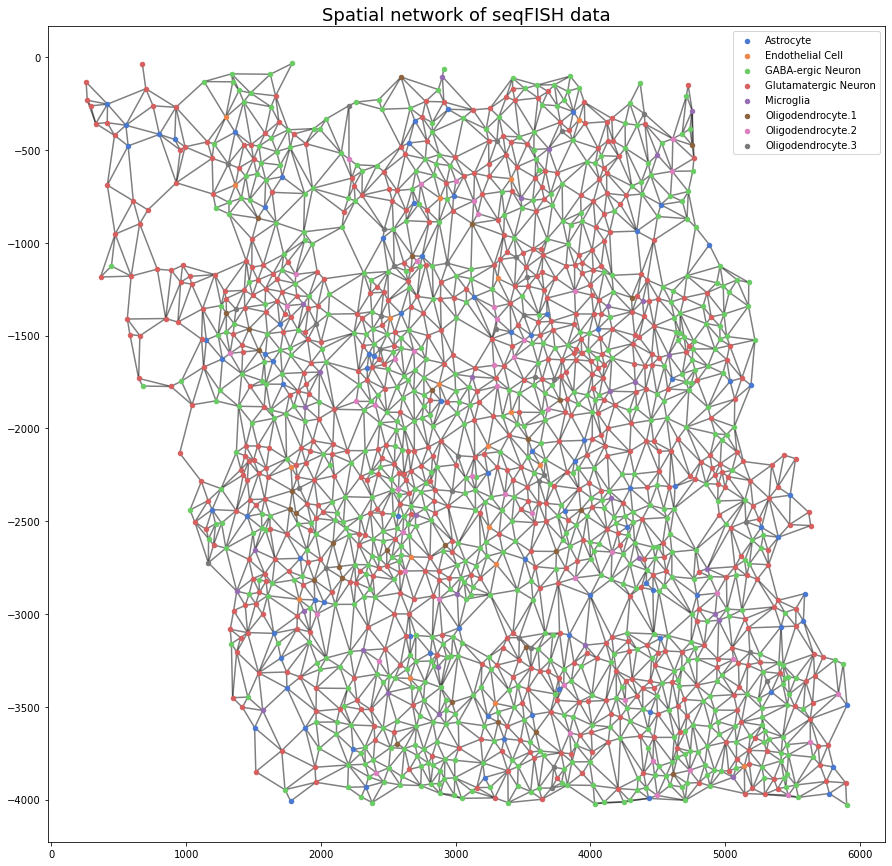

In [19]:
# distance threshold to discard edges above it
#  mainly artifacts at the borders of the whole dataset
EDGE_DIST_THRESH = 300 
selection = distances < EDGE_DIST_THRESH
pairs = vor.ridge_points[selection,:]

fig, ax = plt.subplots(figsize=[15, 15])
for points in voro_cells[selection,:]:
    ax.plot(points[[0,2]],points[[1,3]], c='k',zorder=0, alpha=0.5)
for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax.scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=20, zorder=10)
plt.legend()

title = 'Spatial network of seqFISH data'
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

Instead of cutting edges, we could give them weight thats decrease with distance. But that's an improvement that requires some time to implement.  
The next step is, for each node, look at its neighboors, and aggregate in some way their gene expression data.  
In the first place I think about mean and variance in order to capture the (non)homogeneity of cell types in the area.

### Neighbors gene expression aggregation

We want to aggregate gene expression data up the 2nd, 3rd ot k-th neighbors.

#### Functions definition

In [20]:
def neighbors(pairs, n):
    """
    Return the list of neighbors of a node in a network defined 
    by edges between pairs of nodes. 
    
    Parameters
    ----------
    pairs : array_like
        Pairs of nodes' id that define the network's edges.
    n : int
        The node for which we look for the neighbors.
        
    Returns
    -------
    neigh : array_like
        The indices of neighboring nodes.
    """
    
    left_neigh = pairs[pairs[:,1] == n, 0]
    right_neigh = pairs[pairs[:,0] == n, 1]
    neigh = np.hstack( (left_neigh, right_neigh) ).flatten()
    
    return neigh

def neighbors_k_order(pairs, n, order):
    """
    Return the list of up the kth neighbors of a node 
    in a network defined by edges between pairs of nodes
    
    Parameters
    ----------
    pairs : array_like
        Pairs of nodes' id that define the network's edges.
    n : int
        The node for which we look for the neighbors.
    order : int
        Max order of neighbors.
        
    Returns
    -------
    all_neigh : list
        The list of lists of 1D array neighbor and the corresponding order
    
    
    Examples
    --------
    >>> pairs = np.array([[0, 10],
                        [0, 20],
                        [0, 30],
                        [10, 110],
                        [10, 210],
                        [10, 310],
                        [20, 120],
                        [20, 220],
                        [20, 320],
                        [30, 130],
                        [30, 230],
                        [30, 330],
                        [10, 20],
                        [20, 30],
                        [30, 10],
                        [310, 120],
                        [320, 130],
                        [330, 110]])
    >>> neighbors_k_order(pairs, 0, 2)
    [[array([0]), 0],
     [array([10, 20, 30]), 1],
     [array([110, 120, 130, 210, 220, 230, 310, 320, 330]), 2]]
    """
    
    # all_neigh stores all the unique neighbors and their oder
    all_neigh = [[np.array([n]), 0]]
    unique_neigh = np.array([n])
    
    for k in range(order):
        # detected neighbor nodes at the previous order
        last_neigh = all_neigh[k][0]
        k_neigh = []
        for node in last_neigh:
            # aggregate arrays of neighbors for each previous order neighbor
            neigh = np.unique(neighbors(pairs, node))
            k_neigh.append(neigh)
        # aggregate all unique kth order neighbors
        if len(k_neigh) > 0:
            k_unique_neigh = np.unique(np.concatenate(k_neigh, axis=0))
            # select the kth order neighbors that have never been detected in previous orders
            keep_neigh = np.in1d(k_unique_neigh, unique_neigh, invert=True)
            k_unique_neigh = k_unique_neigh[keep_neigh]
            # register the kth order unique neighbors along with their order
            all_neigh.append([k_unique_neigh, k+1])
            # update array of unique detected neighbors
            unique_neigh = np.concatenate([unique_neigh, k_unique_neigh], axis=0)
        else:
            break
        
    return all_neigh

def flatten_neighbors(all_neigh):
    """
    Convert the list of neighbors 1D arrays with their order into
    a single 1D array of neighbors.

    Parameters
    ----------
    all_neigh : list
        The list of lists of 1D array neighbor and the corresponding order.

    Returns
    -------
    flat_neigh : array_like
        The indices of neighboring nodes.
        
    Examples
    --------
    >>> all_neigh = [[np.array([0]), 0],
                     [np.array([10, 20, 30]), 1],
                     [np.array([110, 120, 130, 210, 220, 230, 310, 320, 330]), 2]]
    >>> flatten_neighbors(all_neigh)
    array([  0,  10,  20,  30, 110, 120, 130, 210, 220, 230, 310, 320, 330])
        
    Notes
    -----
    For future features it should return a 2D array of
    nodes and their respective order.
    """
    
    list_neigh = []
#     list_order = []
    for neigh, order in all_neigh:
        list_neigh.append(neigh)
#         list_order.append(np.ones(neigh.size) * order)
    flat_neigh = np.concatenate(list_neigh, axis=0)
#     flat_order = np.concatenate(list_order, axis=0)
#     flat_neigh = np.vstack([flat_neigh, flat_order]).T

    return flat_neigh

def aggregate_k_neighbors(X, pairs, order=1, var_names=None):
    """
    Compute the statistics on aggregated variables across
    the k order neighbors of each node in a network.

    Parameters
    ----------
    X : array_like
        The data on which to compute statistics (mean, std, ...).
    pairs : array_like
        Pairs of nodes' id that define the network's edges.
    order : int
        Max order of neighbors.
    var_names : list
        Names of variables of X.

    Returns
    -------
    aggregg : dataframe
        Statistics of X.
        
    Examples
    --------
    >>> pairs = vor.ridge_points[selection,:]
    >>> genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=2)
    """
    
    nb_obs = X.shape[0]
    nb_var = X.shape[1]
    aggreg = np.zeros((nb_obs, nb_var*2)) # *2 because mean and variance are stored

    for i in range(nb_obs):
        all_neigh = neighbors_k_order(pairs, n=i, order=order)
        neigh = flatten_neighbors(all_neigh)
        aggreg[i,:nb_var] = X[neigh,:].mean(axis=0)
        aggreg[i,-nb_var:] = X[neigh,:].std(axis=0)
    
    if var_names is None:
        var_names = [str(i) for i in range(nb_var)]
    columns = [var + ' mean' for var in var_names] +\
              [var + ' std' for var in var_names]
    aggreg = pd.DataFrame(data=aggreg, columns=columns)
    
    return aggreg

def make_cluster_cmap(labels, grey_pos='start'):
    """
    Creates an appropriate colormap for a vector of cluster labels.
    
    Parameters
    ----------
    labels : array_like
        The labels of multiple clustered points
    grey_pos: str
        Where to put the grey color for the noise
    
    Returns
    -------
    cmap : matplotlib colormap object
        A correct colormap
    
    Examples
    --------
    >>> my_cmap = make_cluster_cmap(labels=np.array([-1,3,5,2,4,1,3,-1,4,2,5]))
    """
    
    from matplotlib.colors import ListedColormap
    
    if labels.max() < 9:
        cmap = list(plt.get_cmap('tab10').colors)
        if grey_pos == 'end':
            cmap.append(cmap.pop(-3))
        elif grey_pos == 'start':
            cmap = [cmap.pop(-3)] + cmap
        elif grey_pos == 'del':
            del cmap[-3]
    else:
        cmap = list(plt.get_cmap('tab20').colors)
        if grey_pos == 'end':
            cmap.append(cmap.pop(-6))
            cmap.append(cmap.pop(-6))
        elif grey_pos == 'start':
            cmap = [cmap.pop(-5)] + cmap
            cmap = [cmap.pop(-5)] + cmap
        elif grey_pos == 'del':
            del cmap[-5]
            del cmap[-5]
    cmap = ListedColormap(cmap)
    
    return cmap

#### Visualization of exemplary network

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

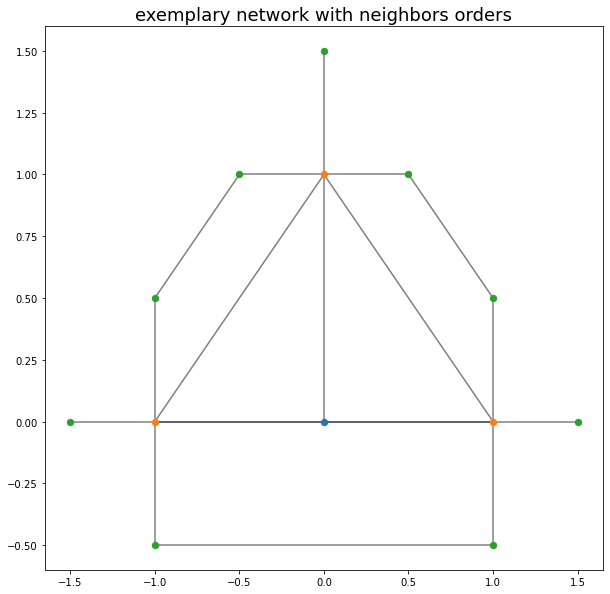

In [38]:
pairs = np.array([[0, 10],
                  [0, 20],
                  [0, 30],
                  [10, 110],
                  [10, 210],
                  [10, 310],
                  [20, 120],
                  [20, 220],
                  [20, 320],
                  [30, 130],
                  [30, 230],
                  [30, 330],
                  [10, 20],
                  [20, 30],
                  [30, 10],
                  [310, 120],
                  [320, 130],
                  [330, 110]])

from collections import OrderedDict 
pos = OrderedDict([
                   (0, [0, 0]),
                   (10, [-1, 0]),
                   (20, [0, 1]),
                   (30, [1, 0]),
                   (110, [-1, -0.5]),
                   (210, [-1.5, 0]),
                   (310, [-1, 0.5]),
                   (120, [-0.5, 1]),
                   (220, [0, 1.5]),
                   (320, [0.5, 1]),
                   (130, [1, 0.5]),
                   (230, [1.5, 0]),
                   (330, [1, -0.5])
                  ])

order = [0] + [1] * 3 + [2] * 9
order_cmap = cmap = list(plt.get_cmap('tab10').colors)
order_color = [order_cmap[x] for x in order]

fig, ax = plt.subplots(figsize=[10, 10])
for a, b in pairs:
    xa, ya = pos[a]
    xb, yb = pos[b]
    ax.plot([xa, xb], [ya, yb], c='k',zorder=0, alpha=0.5)
for i, (x, y) in enumerate(pos.values()):
    ax.scatter(x, y, c=order_color[i], marker='o', s=40, zorder=10)
    
title = "exemplary network with neighbors orders"
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

In [39]:
all_neigh = neighbors_k_order(pairs, 0, 6)
all_neigh

[[array([0]), 0],
 [array([10, 20, 30]), 1],
 [array([110, 120, 130, 210, 220, 230, 310, 320, 330]), 2],
 [array([], dtype=int64), 3]]

In [40]:
flatten_neighbors(all_neigh)

array([  0,  10,  20,  30, 110, 120, 130, 210, 220, 230, 310, 320, 330])

#### First order neighbors

In [172]:
pairs = vor.ridge_points[selection,:]
genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=1, var_names=seqFISH_drop.columns)

In [173]:
# For the visualization
marker = 'o'
size_points = 10

In [174]:
reducer = umap.UMAP(random_state=0)
embedding = reducer.fit_transform(genes_aggreg)
embedding.shape

(1597, 2)

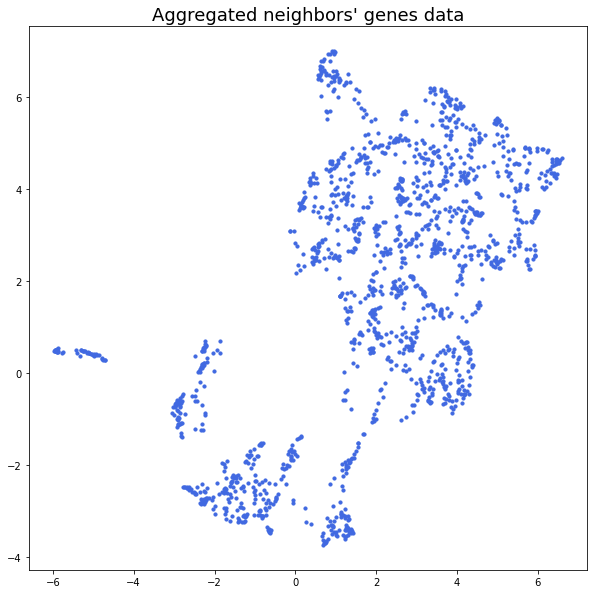

In [175]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' genes data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

It looks like we can define some clusters :)

### Neighboors aggregated genes clustering

Now we can use our favorite clustering algorithm to find groups of similar points: HAC, OPTICS or HDBSCAN for instance.

#### HDBSCAN

In [176]:
clusterer = hdbscan.HDBSCAN(metric='euclidean')
clusterer.fit(genes_aggreg)
labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 2 clusters


That isn't good at all!  
We can try another algorithm

#### OPTICS

Defaults values are:  
`OPTICS(min_samples=5, max_eps=inf, metric='minkowski', p=2, metric_params=None, cluster_method='xi', eps=None, xi=0.05, predecessor_correction=True, min_cluster_size=None, algorithm='auto', leaf_size=30, n_jobs=None)`  
a minkowsky distance with `p=2` is the euclidian distance, so that's fine

In [177]:
clust = OPTICS()
# Run the fit
clust.fit(genes_aggreg)
labels_opt = clust.labels_
nb_clust_opt = labels_opt.max() + 1
print(f"OPTICS has detected {nb_clust_opt} clusters")

OPTICS has detected 24 clusters


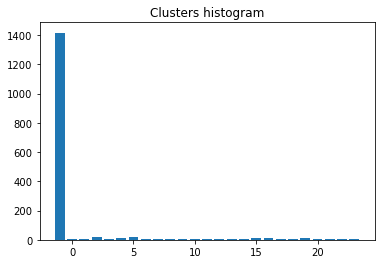

In [178]:
class_id, class_count = np.unique(labels_opt, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

Most of points are classified as `-1`, which mean noise, which is bad!

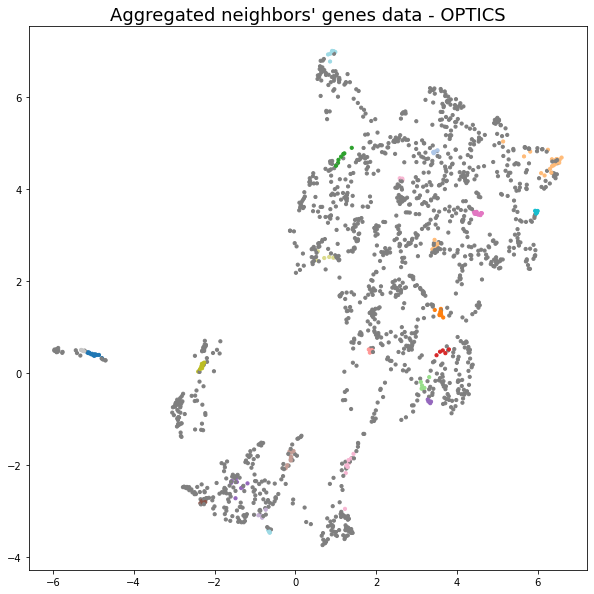

In [179]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_opt,
            cmap=make_cluster_cmap(labels_opt),
            marker=marker,
            s=size_points)
title = "Aggregated neighbors' genes data - OPTICS"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

That is not much better!  

We should perform the clusterization on the reduced space, although it should be done with a lot of precautions (distances are not straighforwardly interpretable)

#### HDBSCAN on reduced space

UMAP projection with parameters adapted for clustering

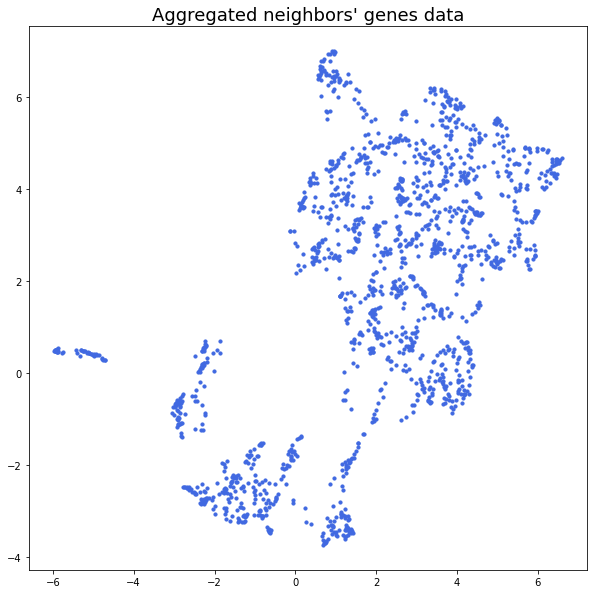

In [190]:
embedding = umap.UMAP(n_neighbors=30,
                      min_dist=0.0,
                      n_components=2,
                      random_state=0,
                      ).fit_transform(genes_aggreg)

plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' genes data"
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

In [191]:
clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=30, min_samples=1)
clusterer.fit(embedding)
labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 5 clusters


we choose `min_samples=1` to avoid having points considered as noise

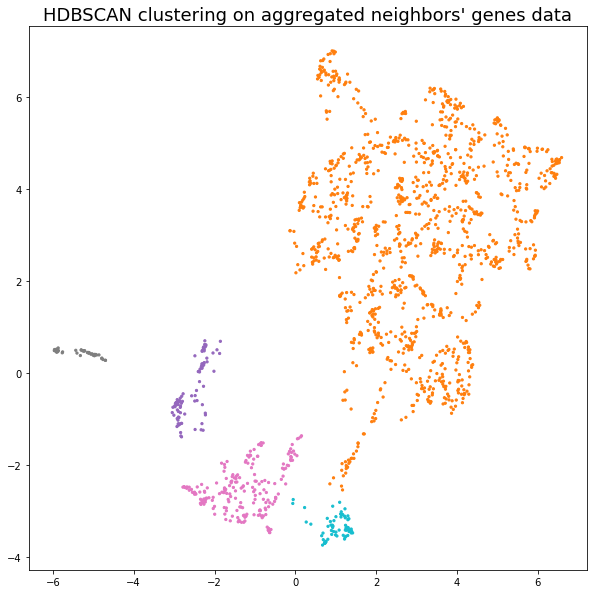

In [192]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_hdbs,
            s=5,
            cmap=make_cluster_cmap(labels_hdbs));

title = "HDBSCAN clustering on aggregated neighbors' genes data"
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

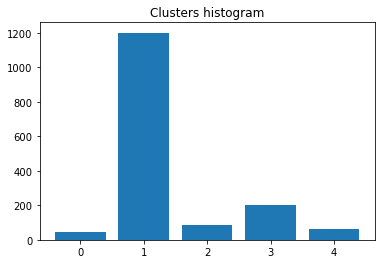

In [193]:
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

This is pretty good :)  
Of course one can tweak the parameters to obtain a clustering that fits him better.

#### OPTICS on reduced space

In [194]:
clust = OPTICS(min_cluster_size=50)
# Run the fit
clust.fit(embedding)

labels_opt = clust.labels_
nb_clust_opt = labels_opt.max() + 1
print(f"OPTICS has detected {nb_clust_opt} clusters")

OPTICS has detected 10 clusters


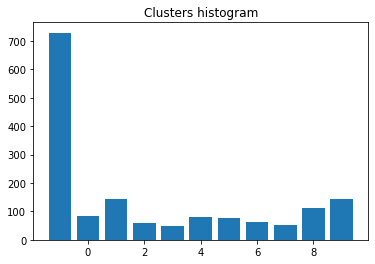

In [195]:
class_id, class_count = np.unique(clust.labels_, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

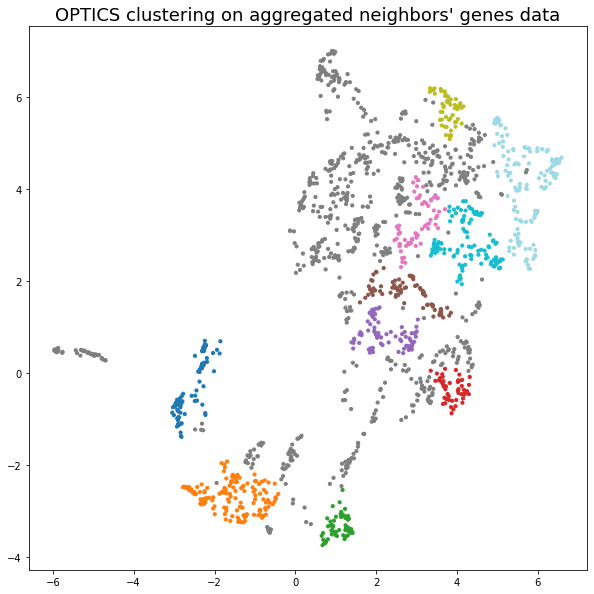

In [196]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_opt,
            cmap=make_cluster_cmap(labels_opt),
            marker=marker,
            s=size_points)

title = "OPTICS clustering on aggregated neighbors' genes data"
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

HDBSCAN provides a much better clustering regarding the data projection.

#### Visualisation of spatial seqFISH data and detected areas 

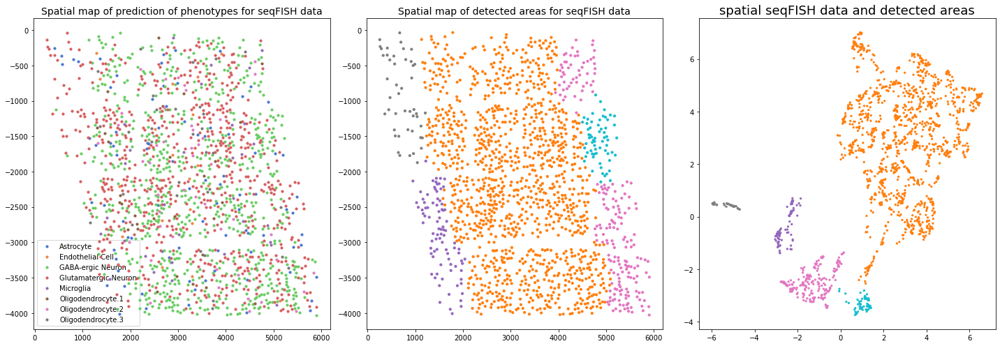

In [197]:
fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=True)

for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax[0].scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=20, zorder=10)
ax[0].set_title('Spatial map of prediction of phenotypes for seqFISH data', fontsize=14);
ax[0].legend()

ax[1].scatter(seqFISH_coords.loc[:,'x'], seqFISH_coords.loc[:,'y'], c=labels_hdbs, cmap=make_cluster_cmap(labels_hdbs), marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[2].scatter(embedding[:, 0], embedding[:, 1], c=labels_hdbs, s=5, cmap=make_cluster_cmap(labels_hdbs));
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

title = "spatial seqFISH data and detected areas"
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

The detected areas look plausible as points affected to different area types are not randomly dispersed.  
Moreover will see with future configurations that the detected areas span over areas of some phenotypes or form regions smaller than areas of some phenotypes.

#### Screening of order and clustering

In [ ]:
clf_name = 'Kernel SVC'
nb_genes = scRNAseq_drop.shape[1]
save_dir = Path(f'../data/processed/nb_genes {nb_genes} - {clf_name}')
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

orders = [1, 2, 3, 4]

for order in orders:
    # compute statistics on aggregated data across neighbors
    genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=order, var_names=seqFISH_drop.columns)
    
    # Dimension reduction for visualization
    embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)

    for dim_clust in [2,3,4,5,6,7,8,9]:
        # Dimension reduction for clustering
        embed_clust = umap.UMAP(n_neighbors=30,
                                min_dist=0.0,
                                n_components=dim_clust,
                                random_state=0,
                               ).fit_transform(genes_aggreg)

        for min_cluster_size in [10,20,30,40,50,60]:
            clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
            clusterer.fit(embed_clust)
            labels_hdbs = clusterer.labels_
            nb_clust_hdbs = labels_hdbs.max() + 1
            print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

            # Histogram of classes
            fig = plt.figure()
            class_id, class_count = np.unique(labels_hdbs, return_counts=True)
            plt.bar(class_id, class_count, width=0.8);
            plt.title('Clusters histogram');
            title = f"Clusters histogram - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
            plt.savefig(save_dir / title, bbox_inches='tight')
            plt.show()

            # Big summary plot
            fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=False)

            for class_pred, label, color in color_labels:
                select = class_pred == y_pred
                ax[0].scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=20, zorder=10)
            ax[0].set_title('Spatial map of prediction of phenotypes for seqFISH data', fontsize=14);
            ax[0].legend()

            ax[1].scatter(seqFISH_coords.loc[:,'x'], seqFISH_coords.loc[:,'y'], c=labels_hdbs, cmap=make_cluster_cmap(labels_hdbs), marker=marker, s=size_points)
            ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

            ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=make_cluster_cmap(labels_hdbs));
            ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

            suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
            fig.suptitle(suptitle, fontsize=14)
            fig.savefig(save_dir / suptitle, bbox_inches='tight')
            plt.show()

Some config that are interesting, for analyzes or for the presentation:

| order | clust_dim | min_size |            remark            |
|:-----:|:---------:|:--------:|:----------------------------:|
|   1   |     5     |    30    |                              |
|   1   |     6     |    40    |           or 50, 60          |
|   1   |     9     |    30    |                              |
|   2   |     2     |    40    |                              |
|   2   |     4     |    30    |                              |
|   2   |     5     |    60    |                              |
|   2   |     8     |    40    | to explain link between maps |
|   3   |     2     |    40    |                              |
|   3   |     4     |    40    |                              |
|   3   |     66    |    40    |                              |
|   4   |     3     |    60    |        to show oder 4        |
|   4   |     7     |    50    |             idem             |

#### Summary image for the white paper

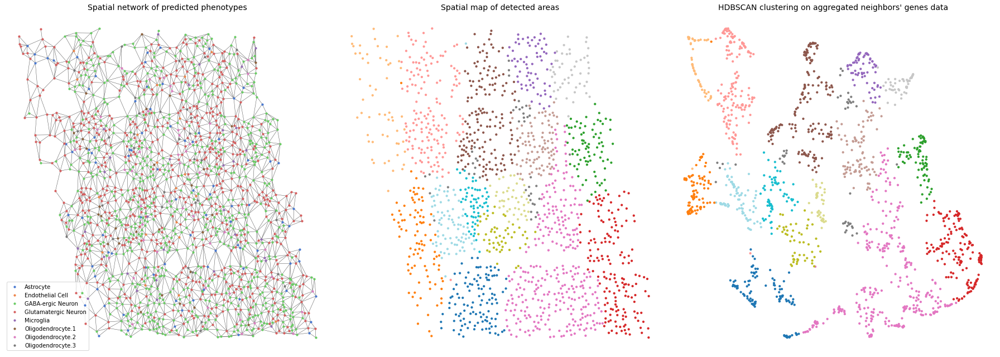

In [32]:
pairs = vor.ridge_points[selection,:]
marker = 'o'
size_points = 10

clf_name = 'Kernel SVC'
nb_genes = scRNAseq_drop.shape[1]

order = 2
dim_clust = 2
min_cluster_size = 40

# compute statistics on aggregated data across neighbors
genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=order, var_names=seqFISH_drop.columns)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)


# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(genes_aggreg)


clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
clusterer.fit(embed_clust)
labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

# Big summary plot
fig, ax = plt.subplots(1, 3, figsize=(25,9), tight_layout=True)

# Network
for points in voro_cells[selection,:]:
    ax[0].plot(points[[0,2]],points[[1,3]],zorder=0, c='k', alpha=0.7, linewidth=0.5)
for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax[0].scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker=marker, s=size_points, zorder=10)
ax[0].set_title('Spatial network of predicted phenotypes', fontsize=14);
ax[0].axis('off')
ax[0].legend()

# Detected areas
ax[1].scatter(seqFISH_coords.loc[:,'x'], seqFISH_coords.loc[:,'y'], c=labels_hdbs, cmap=make_cluster_cmap(labels_hdbs), marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas', fontsize=14);
ax[1].axis('off')

# HDBSCAN clustering on UMAP projection
ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, marker=marker, s=size_points, cmap=make_cluster_cmap(labels_hdbs));
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);
ax[2].axis('off')

suptitle = f"Areas detection from seqFISH spatial network - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
# fig.suptitle(suptitle, fontsize=14)
fig.savefig("../data/processed/"+suptitle, bbox_inches='tight')
plt.show()

## Differential Expression analysis

Accross the diverse configurations, there are regions that appear consistently.  
One of them is curious, on the spatial map it's a spot in the middle of a huge class of cells.  
To analyse why these cells stand out in several configuration we will use the config: `order=1, dim_clust=5, min_clust_size=30`, but other config are possible too.

In [31]:
# For the visualization
marker = 'o'
size_points = 10

order = 1
nb_genes = seqFISH_drop.shape[0]
clf_name = 'Kernel SVC'

# compute statistics on aggregated data across neighbors
genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=order, var_names=seqFISH_drop.columns)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)

dim_clust = 5
# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(genes_aggreg)

min_cluster_size = 30
clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
clusterer.fit(embed_clust)
labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

Text(0.5, 0.98, 'Spatial seqFISH data and detected areas - nb_genes 1597 - Kernel SVC - order 1 - dim_clust 5 - min_cluster_size 30')

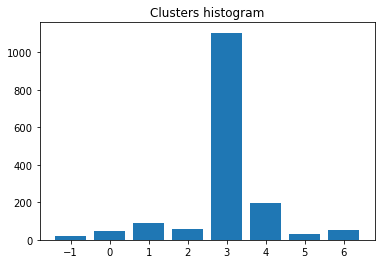

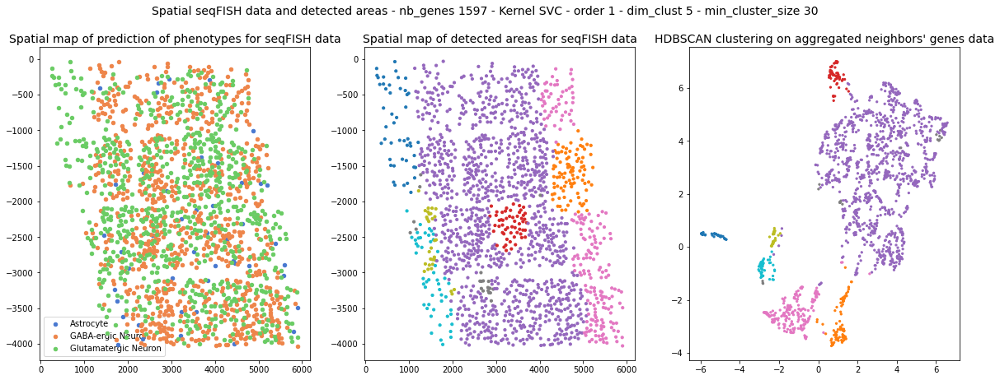

In [38]:
# Histogram of classes
fig = plt.figure()
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

# Big summary plot
fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=False)

for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax[0].scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=20, zorder=10)
ax[0].set_title('Spatial map of prediction of phenotypes for seqFISH data', fontsize=14);
ax[0].legend()

ax[1].scatter(seqFISH_coords.loc[:,'x'], seqFISH_coords.loc[:,'y'], c=labels_hdbs, cmap=make_cluster_cmap(labels_hdbs), marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=make_cluster_cmap(labels_hdbs));
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
fig.suptitle(suptitle, fontsize=14)

In [39]:
import scanpy as sc

In [70]:
adata = sc.AnnData(genes_aggreg)
# adata.obs['cell_clusters'] = labels_hdbs
adata.obs['cell_clusters'] = pd.Series(labels_hdbs, dtype="category")

/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


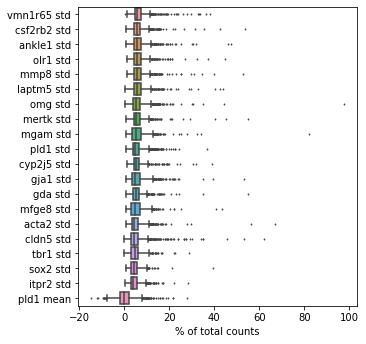

In [73]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [74]:
sc.tl.rank_genes_groups(adata, groupby='cell_clusters', method='t-test')

/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/scanpy/preprocessing/_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/__init__.py:318: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  ax.set_ylim(ymin, ymax)


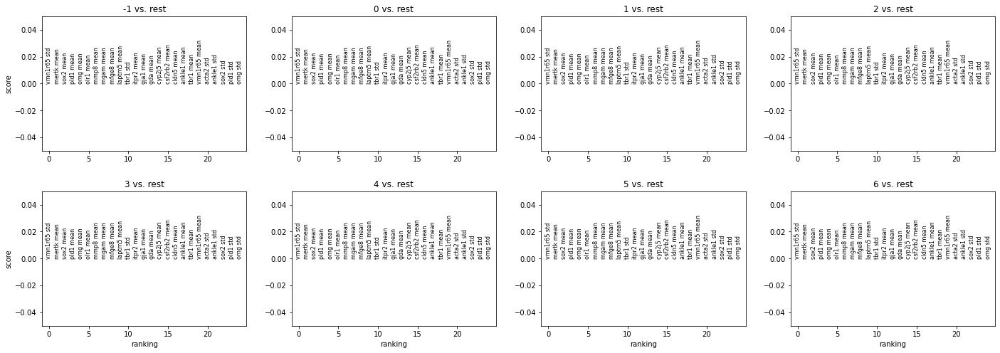

In [75]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

I have issue with Scanpy and Anndata

### Home made DE analysis

Are the values normaly distributed?

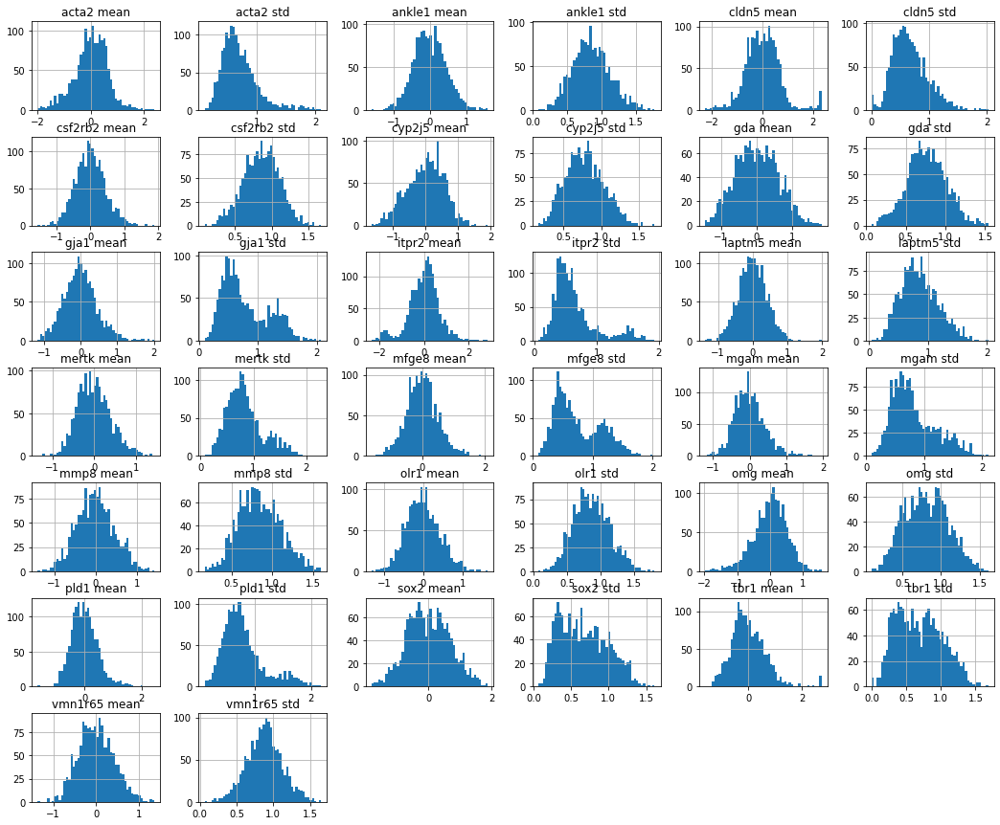

In [78]:
genes_aggreg.hist(bins=50, figsize=(18,15));

It would be nice to display the histogram of each cluster per gene, but no time!

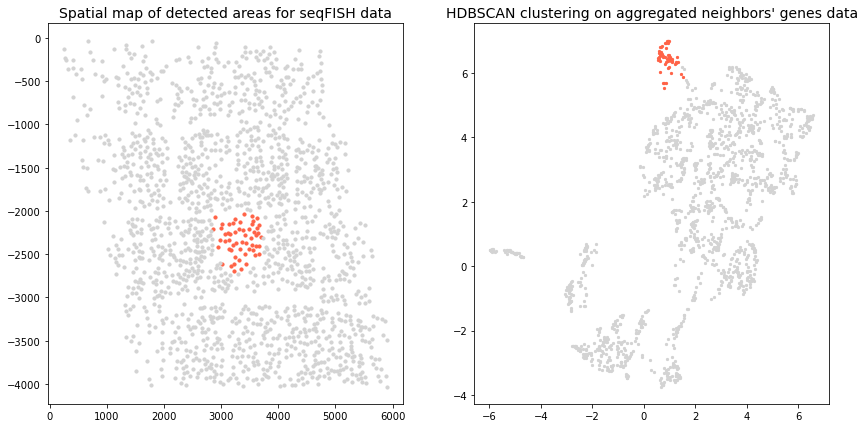

In [92]:
clust_id = 2
clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

ax[0].scatter(seqFISH_coords.loc[clust_targ,'x'], seqFISH_coords.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
ax[0].scatter(seqFISH_coords.loc[clust_comp,'x'], seqFISH_coords.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
ax[0].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

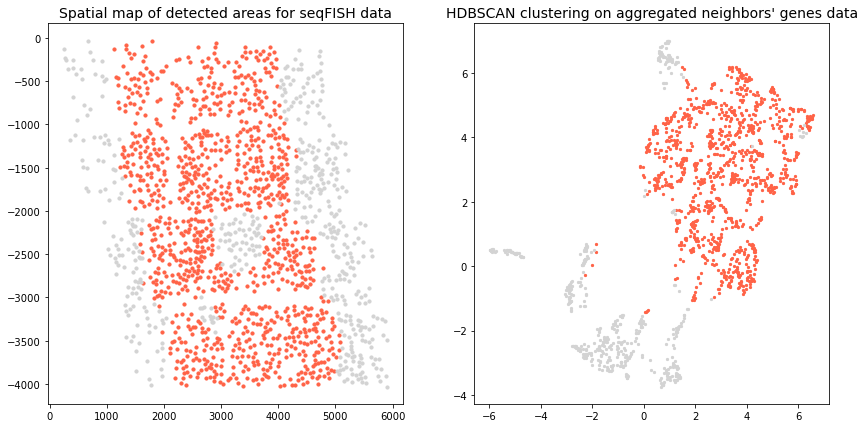

In [93]:
clust_id = 3
clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

ax[0].scatter(seqFISH_coords.loc[clust_targ,'x'], seqFISH_coords.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
ax[0].scatter(seqFISH_coords.loc[clust_comp,'x'], seqFISH_coords.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
ax[0].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

So we will compare cluster 2 vs the rest, and cluster 2 vs cluster 3.

In [104]:
from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

var_names = genes_aggreg.columns
distrib_pval = {'Welch': [],
                'Mann-Whitney': [],
                'Kolmogorov-Smirnov': []}
select_1 = labels_hdbs == 2
select_2 = labels_hdbs == 3
for var_name in var_names:
    dist1 = genes_aggreg.loc[select_1, var_name]
    dist2 = genes_aggreg.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
    mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
    distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [107]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

In [109]:
DE_pval.T.style.apply(highlight_under)

,acta2 mean,ankle1 mean,cldn5 mean,csf2rb2 mean,cyp2j5 mean,gda mean,gja1 mean,itpr2 mean,laptm5 mean,mertk mean,mfge8 mean,mgam mean,mmp8 mean,olr1 mean,omg mean,pld1 mean,sox2 mean,tbr1 mean,vmn1r65 mean,acta2 std,ankle1 std,cldn5 std,csf2rb2 std,cyp2j5 std,gda std,gja1 std,itpr2 std,laptm5 std,mertk std,mfge8 std,mgam std,mmp8 std,olr1 std,omg std,pld1 std,sox2 std,tbr1 std,vmn1r65 std
Welch,0.000000,0.000000,0.000000,0.136006,0.477232,0.000000,0.005034,0.167642,0.394251,0.478784,0.948338,0.088345,0.000026,0.348377,0.000022,0.009646,0.000000,0.000000,0.000849,0.326429,0.012056,0.001224,0.497603,0.000050,0.096223,0.000039,0.416639,0.000054,0.360886,0.268715,0.554449,0.913901,0.028678,0.028517,0.002108,0.000000,0.005806,0.860745
Mann-Whitney,0.000000,0.000000,0.000000,0.014472,0.274654,0.000000,0.000765,0.049789,0.257002,0.248959,0.422914,0.094824,0.000132,0.165522,0.000022,0.012256,0.000000,0.000002,0.000101,0.045574,0.063832,0.000005,0.285203,0.000715,0.059541,0.000002,0.143296,0.000035,0.084482,0.027266,0.440826,0.488321,0.022534,0.017688,0.021515,0.000000,0.000985,0.407399
Kolmogorov-Smirnov,0.000000,0.000000,0.000000,0.006218,0.148175,0.000000,0.006016,0.001522,0.562185,0.469076,0.983288,0.148995,0.001638,0.659190,0.000344,0.055541,0.000000,0.000058,0.001723,0.146134,0.019012,0.000000,0.081832,0.004705,0.048300,0.000000,0.053779,0.003201,0.210803,0.001213,0.378698,0.968535,0.154740,0.059023,0.000056,0.000000,0.003506,0.957841


In [125]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

cldn5 mean      9.992007e-16
sox2 std        2.559331e-11
sox2 mean       8.940493e-11
acta2 mean      1.367184e-10
cldn5 std       5.875018e-09
gja1 std        7.996508e-08
ankle1 mean     1.369820e-07
gda mean        4.636062e-07
pld1 std        5.610144e-05
tbr1 mean       5.768344e-05
omg mean        3.441755e-04
mfge8 std       1.212569e-03
itpr2 mean      1.522359e-03
mmp8 mean       1.638344e-03
vmn1r65 mean    1.722830e-03
laptm5 std      3.201057e-03
tbr1 std        3.505983e-03
cyp2j5 std      4.705499e-03
gja1 mean       6.016150e-03
csf2rb2 mean    6.218308e-03
ankle1 std      1.901181e-02
gda std         4.830005e-02
Name: Kolmogorov-Smirnov, dtype: float64

In [126]:
diff_var_set = set([var.replace(' mean', '').replace(' std','') for var in diff_var.index])
for var in diff_var_set:
    print(var)

mfge8
csf2rb2
vmn1r65
gda
ankle1
cldn5
tbr1
cyp2j5
pld1
acta2
laptm5
sox2
omg
mmp8
itpr2
gja1


In [119]:
for var in seqFISH_drop.columns:
    print(var)

acta2
ankle1
cldn5
csf2rb2
cyp2j5
gda
gja1
itpr2
laptm5
mertk
mfge8
mgam
mmp8
olr1
omg
pld1
sox2
tbr1
vmn1r65


## Whole analysis **with all** seqFISH genes

In [74]:
gene_names = list(scRNAseq.columns)

scaler_sc = StandardScaler()  # for scRNAseq
scaler_seq = StandardScaler() # for seqFISH
Xtest = scaler_sc.fit_transform(scRNAseq)
Xpred = scaler_seq.fit_transform(seqFISH)  
nb_genes = Xpred.shape[1]
print(f"There are {nb_genes} remaining genes")

There are 113 remaining genes


#### Predict phenotypes of seqFISH cells - Linear SVC

In [75]:
model = 'Linear SVC'

param_search = pd.read_csv('../data/processed/grid_search_cv_results-2020-06-09_18h36.csv')
scoring = 'balanced_accuracy'
best = param_search.loc[param_search['rank '+scoring]==1]
C = best['C'].values[0]

clf = LinearSVC(C=C, class_weight='balanced')
clf.fit(Xtest, y_true)
y_pred = clf.predict(Xpred)

In [76]:
pheno_id, counts = np.unique(y_pred, return_counts=True)
pheno_names = le.inverse_transform(pheno_id)
pd.DataFrame(data={'phenotype':pheno_names,
                   'counts':counts},
             index=pheno_id)

,phenotype,counts
0,Astrocyte,90
1,Endothelial Cell,60
2,GABA-ergic Neuron,612
3,Glutamatergic Neuron,727
4,Microglia,37
5,Oligodendrocyte.1,18
6,Oligodendrocyte.2,14
7,Oligodendrocyte.3,39


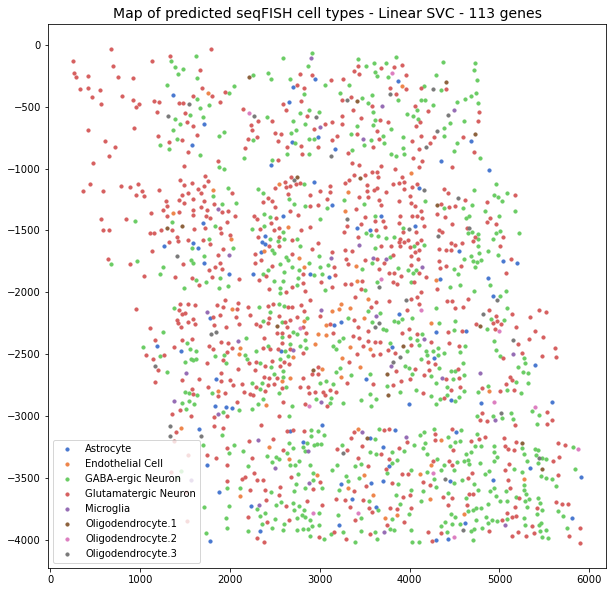

In [77]:
base_cmap = sns.color_palette('muted').as_hex() # plt.get_cmap("Set1")

# make a custom colormap with class integers, labels and hex colors like
# [[0, 'Astrocyte', '#023eff'],
#  [2, 'GABA-ergic Neuron', '#ff7c00'],
#  [3, 'Glutamatergic Neuron', '#1ac938']]
# 
color_labels = []
for i, i_pred in enumerate(np.unique(y_pred)):
    color_labels.append([i_pred, le.inverse_transform([i_pred])[0], base_cmap[i]])

# more custom colormap, switch to previous line if any issue like different class integers
# color_labels = [[0, le.inverse_transform([0])[0], base_cmap[0]],
#                 [2, le.inverse_transform([2])[0], base_cmap[1]],
#                 [3, le.inverse_transform([3])[0], base_cmap[2]]]

fig, ax = plt.subplots(figsize=[10,10])
for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax.scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=10)
plt.legend()

title = f"Map of predicted seqFISH cell types - {model} - {nb_genes} genes"
plt.title(title, fontsize=14);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

#### Predict phenotypes of seqFISH cells - Kernel SVC

In [78]:
model = 'Kernel SVC'

param_search = pd.read_csv('../data/processed/random_search_cv_zoom_results-2020-05-09_09h50.csv')
scoring = 'balanced_accuracy'
best = param_search.loc[param_search['rank '+scoring]==1]
C = best['C'].values[0]
gamma = best['gamma'].values[0]

clf = SVC(C=C, gamma=gamma, class_weight='balanced')
clf.fit(Xtest, y_true)
y_pred = clf.predict(Xpred)

In [79]:
pheno_id, counts = np.unique(y_pred, return_counts=True)
pheno_names = le.inverse_transform(pheno_id)
pd.DataFrame(data={'phenotype':pheno_names,
                   'counts':counts},
             index=pheno_id)

,phenotype,counts
0,Astrocyte,57
1,Endothelial Cell,15
2,GABA-ergic Neuron,849
3,Glutamatergic Neuron,613
4,Microglia,6
5,Oligodendrocyte.1,11
6,Oligodendrocyte.2,45
7,Oligodendrocyte.3,1


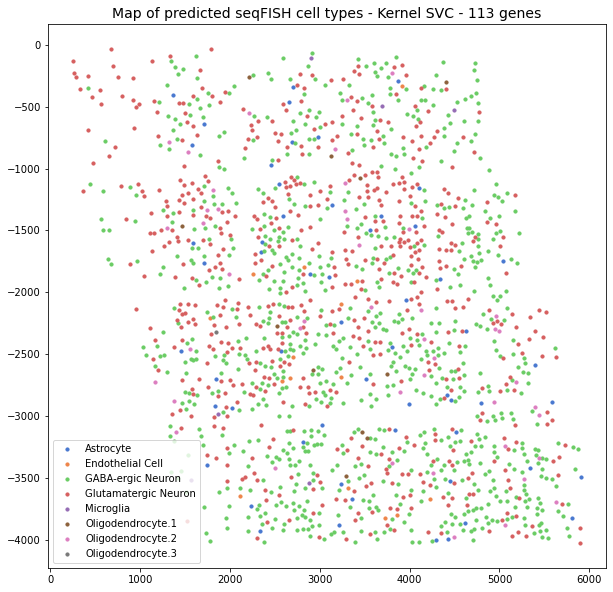

In [80]:
base_cmap = sns.color_palette('muted').as_hex() # plt.get_cmap("Set1")

# make a custom colormap with class integers, labels and hex colors like
# [[0, 'Astrocyte', '#023eff'],
#  [2, 'GABA-ergic Neuron', '#ff7c00'],
#  [3, 'Glutamatergic Neuron', '#1ac938']]
# 
color_labels = []
for i, i_pred in enumerate(np.unique(y_pred)):
    color_labels.append([i_pred, le.inverse_transform([i_pred])[0], base_cmap[i]])

# more custom colormap, switch to previous line if any issue like different class integers
# color_labels = [[0, le.inverse_transform([0])[0], base_cmap[0]],
#                 [2, le.inverse_transform([2])[0], base_cmap[1]],
#                 [3, le.inverse_transform([3])[0], base_cmap[2]]]

fig, ax = plt.subplots(figsize=[10,10])
for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax.scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=10)
plt.legend()

title = f"Map of predicted seqFISH cell types - {model} - {nb_genes} genes"
plt.title(title, fontsize=14);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

### Network construction

In [85]:
from scipy.spatial import Voronoi

vor = Voronoi(seqFISH_coords[['x','y']])

# arrays of x0, y0, x1, y1
voro_cells = np.zeros((vor.ridge_points.shape[0],4))
voro_cells[:,[0,1]] = seqFISH_coords.loc[vor.ridge_points[:,0], ['x','y']]
voro_cells[:,[2,3]] = seqFISH_coords.loc[vor.ridge_points[:,1], ['x','y']]
distances = np.sqrt((voro_cells[:,0]-voro_cells[:,2])**2+(voro_cells[:,1]-voro_cells[:,3])**2)

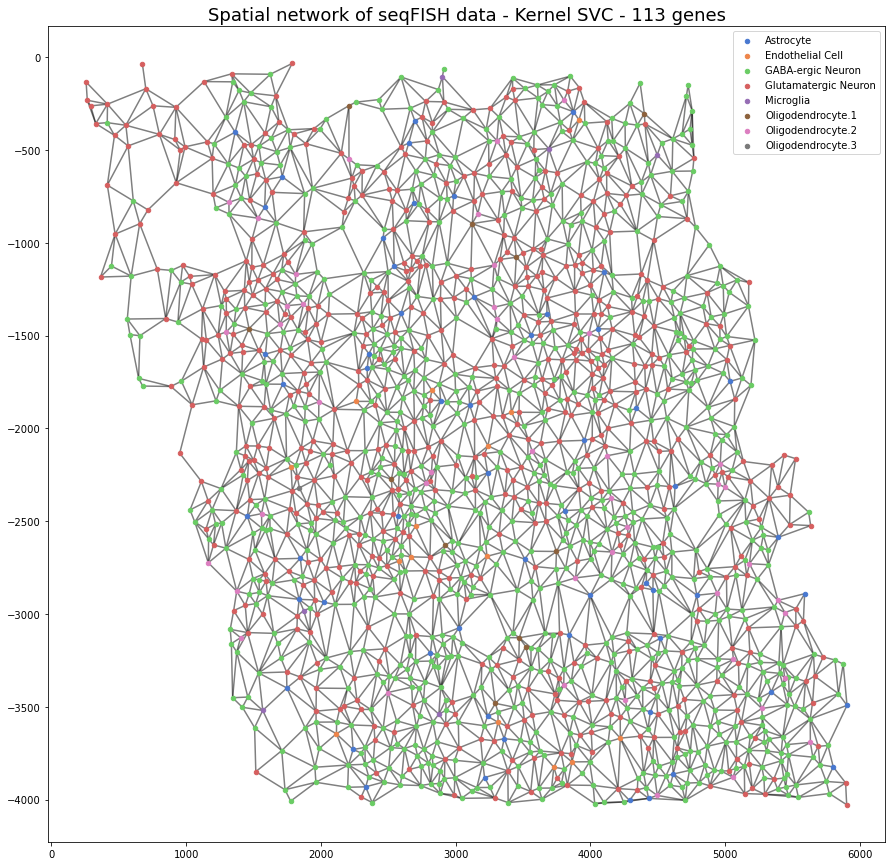

In [86]:
# distance threshold to discard edges above it
#  mainly artifacts at the borders of the whole dataset
EDGE_DIST_THRESH = 300 
selection = distances < EDGE_DIST_THRESH
pairs = vor.ridge_points[selection,:]

fig, ax = plt.subplots(figsize=[15, 15])
for points in voro_cells[selection,:]:
    ax.plot(points[[0,2]],points[[1,3]], c='k',zorder=0, alpha=0.5)
for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax.scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=20, zorder=10)
plt.legend()

title = f'Spatial network of seqFISH data - {model} - {nb_genes} genes'
plt.title(title, fontsize=18);
plt.savefig('../data/processed/'+title, bbox_inches='tight')

### Screening of order and clustering

In [ ]:
clf_name = 'Kernel SVC'

save_dir = Path(f'../data/processed/nb_genes {nb_genes} - {clf_name}')
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

orders = [1, 2, 3, 4]

for order in orders:
    # compute statistics on aggregated data across neighbors
    genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=order, var_names=seqFISH.columns)
    
    # Dimension reduction for visualization
    embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)

    for dim_clust in [2,3,4,5,6,7,8,9]:
        # Dimension reduction for clustering
        embed_clust = umap.UMAP(n_neighbors=30,
                                min_dist=0.0,
                                n_components=dim_clust,
                                random_state=0,
                               ).fit_transform(genes_aggreg)

        for min_cluster_size in [10,20,30,40,50,60]:
            clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
            clusterer.fit(embed_clust)
            labels_hdbs = clusterer.labels_
            nb_clust_hdbs = labels_hdbs.max() + 1
            print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

            # Histogram of classes
            fig = plt.figure()
            class_id, class_count = np.unique(labels_hdbs, return_counts=True)
            plt.bar(class_id, class_count, width=0.8);
            plt.title('Clusters histogram');
            title = f"Clusters histogram - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
            plt.savefig(save_dir / title, bbox_inches='tight')
            plt.show()

            # Big summary plot
            fig, ax = plt.subplots(1, 3, figsize=(22,7), tight_layout=False)

            for class_pred, label, color in color_labels:
                select = class_pred == y_pred
                ax[0].scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=20, zorder=10)
            ax[0].set_title('Spatial map of prediction of phenotypes for seqFISH data', fontsize=14);
            ax[0].legend()

            ax[1].scatter(seqFISH_coords.loc[:,'x'], seqFISH_coords.loc[:,'y'], c=labels_hdbs, cmap=make_cluster_cmap(labels_hdbs), marker=marker, s=size_points)
            ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

            ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=make_cluster_cmap(labels_hdbs));
            ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

            suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
            fig.suptitle(suptitle, fontsize=14)
            fig.savefig(save_dir / suptitle, bbox_inches='tight')
            plt.show()

### DE analysis

We choose for "DE analysis" this configuration: `order=1, dim_clust=3, min_clust_size=30`

In [93]:
# For the visualization
marker = 'o'
size_points = 10

order = 1
nb_genes = seqFISH.shape[1]
clf_name = 'Kernel SVC'

# compute statistics on aggregated data across neighbors
genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=order, var_names=seqFISH.columns)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)

dim_clust = 3
# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(genes_aggreg)

min_cluster_size = 30
clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
clusterer.fit(embed_clust)
labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 19 clusters


Text(0.5, 0.98, 'Spatial seqFISH data and detected areas - nb_genes 113 - Kernel SVC - order 1 - dim_clust 3 - min_cluster_size 30')

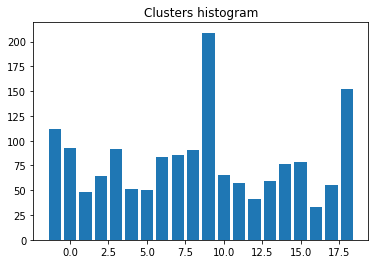

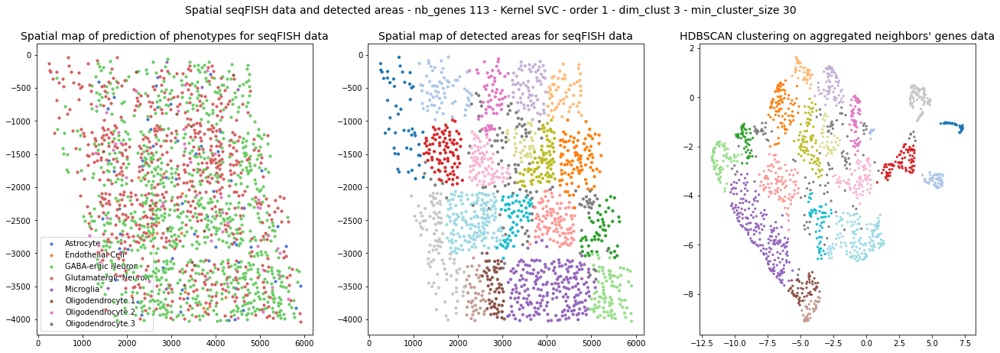

In [96]:
# Histogram of classes
fig = plt.figure()
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

# Big summary plot
fig, ax = plt.subplots(1, 3, figsize=(22,7), tight_layout=False)

for class_pred, label, color in color_labels:
    select = class_pred == y_pred
    ax[0].scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker='o', s=10, zorder=10)
ax[0].set_title('Spatial map of prediction of phenotypes for seqFISH data', fontsize=14);
ax[0].legend()

ax[1].scatter(seqFISH_coords.loc[:,'x'], seqFISH_coords.loc[:,'y'], c=labels_hdbs, cmap=make_cluster_cmap(labels_hdbs), marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=make_cluster_cmap(labels_hdbs));
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
fig.suptitle(suptitle, fontsize=14)

#### Home made DE analysis

Are the values normaly distributed?

/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/home/alexis/Programs/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/home/alexis/P

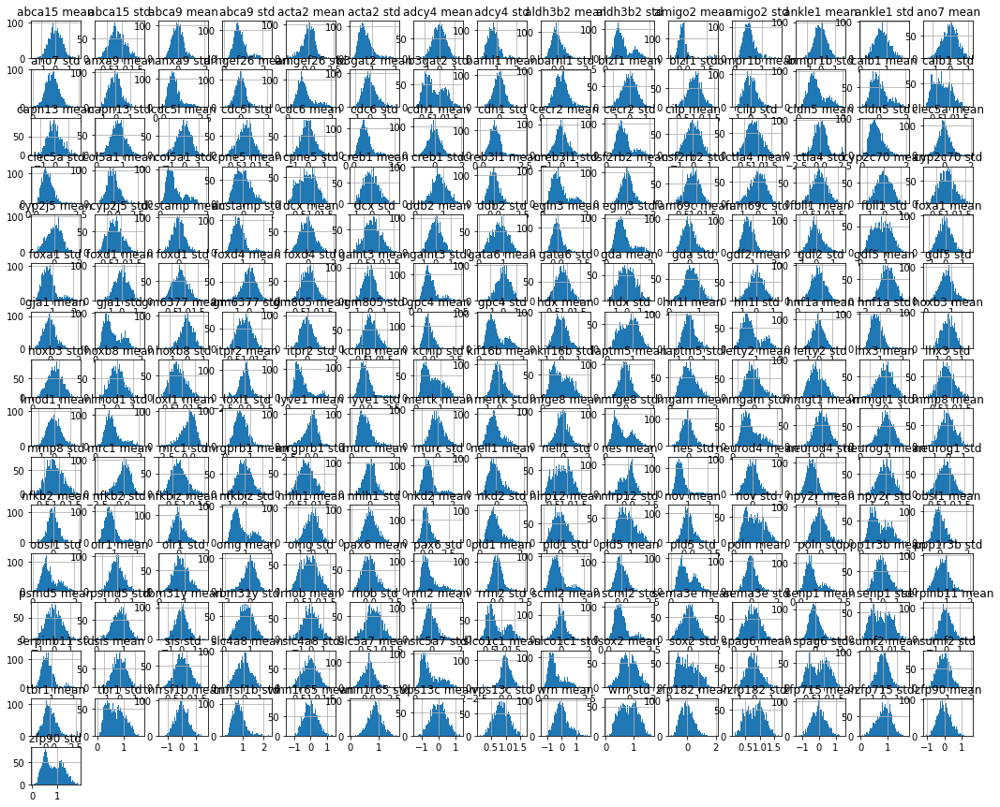

In [97]:
genes_aggreg.hist(bins=50, figsize=(18,15));

It would be nice to display the histogram of each cluster per gene, but no time!

In [ ]:
for clust_id in range(19):
    clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
    clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

    fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

    ax[0].scatter(seqFISH_coords.loc[clust_targ,'x'], seqFISH_coords.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
    ax[0].scatter(seqFISH_coords.loc[clust_comp,'x'], seqFISH_coords.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
    ax[0].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

    ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
    ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
    ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);
    plt.suptitle(f"clust_id = {clust_id}")
    plt.show()

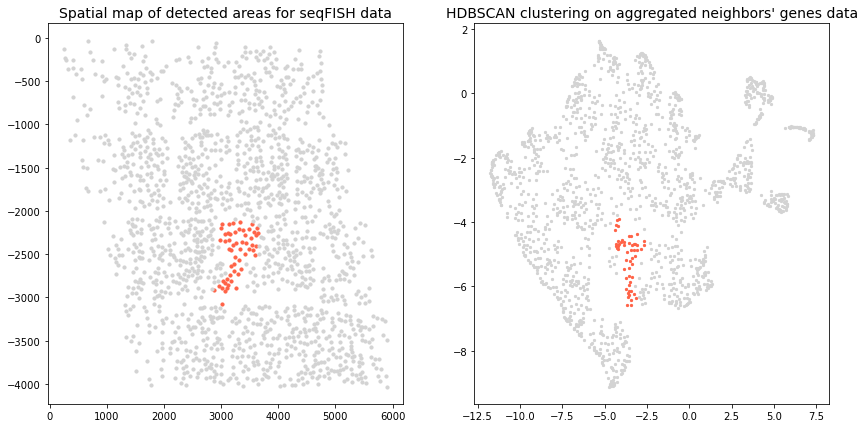

In [115]:
clust_id = 17
clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

ax[0].scatter(seqFISH_coords.loc[clust_targ,'x'], seqFISH_coords.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
ax[0].scatter(seqFISH_coords.loc[clust_comp,'x'], seqFISH_coords.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
ax[0].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

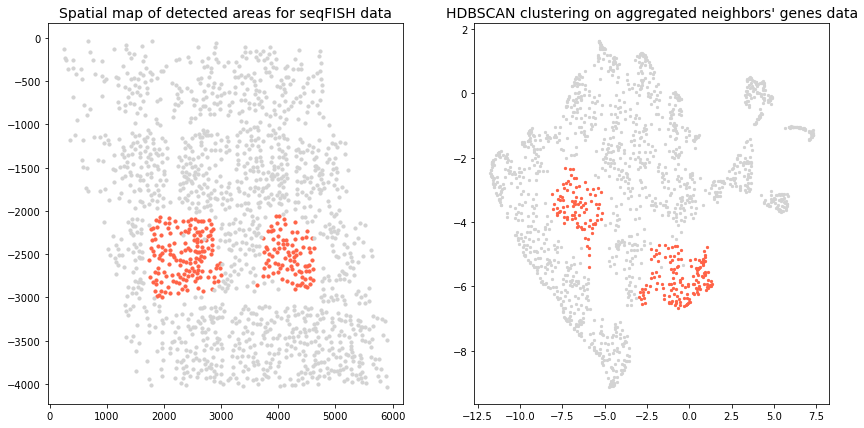

In [126]:
clust_ids = [8, 18]
clust_targ = pd.Series(labels_hdbs).isin(clust_ids)  # clusters of interest (target)
clust_comp = ~clust_targ  # cluster(s) we compare with

fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

ax[0].scatter(seqFISH_coords.loc[clust_targ,'x'], seqFISH_coords.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
ax[0].scatter(seqFISH_coords.loc[clust_comp,'x'], seqFISH_coords.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
ax[0].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

So we will compare cluster 17 vs the rest, and cluster 2 vs clusters 8 and 18.

In [133]:
from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

var_names = genes_aggreg.columns
distrib_pval = {'Welch': [],
                'Mann-Whitney': [],
                'Kolmogorov-Smirnov': []}
select_1 = labels_hdbs == 17
clust_ids = [8, 18]
select_2 = pd.Series(labels_hdbs).isin(clust_ids) 
for var_name in var_names:
    dist1 = genes_aggreg.loc[select_1, var_name]
    dist2 = genes_aggreg.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
    mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
    distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)
DE_pval.sort_values(by='Kolmogorov-Smirnov', inplace=True)

In [134]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

In [135]:
DE_pval.T.style.apply(highlight_under)

,acta2 mean,cldn5 mean,tbr1 mean,zfp182 mean,slco1c1 std,sox2 std,psmd5 mean,gja1 std,pax6 mean,sis mean,cldn5 std,nkd2 mean,sox2 mean,zfp182 std,nlrp12 mean,mrc1 mean,sumf2 mean,barhl1 mean,cdc6 std,neurod4 mean,neurog1 mean,cdh1 std,cdc5l mean,dcstamp mean,obsl1 mean,neurod4 std,tnfrsf1b mean,serpinb11 mean,wrn std,anxa9 mean,mfge8 std,b3gat2 std,lefty2 mean,cpne5 mean,creb3l1 mean,cyp2j5 mean,lyve1 mean,gpc4 std,gja1 mean,gata6 mean,mmgt1 mean,adcy4 mean,tbr1 std,lhx3 std,mrc1 std,abca9 std,kcnip std,itpr2 mean,hdx std,vmn1r65 mean,wrn mean,gm6377 std,hoxb3 std,ankle1 std,omg std,hnf1a mean,gda mean,gdf5 mean,amigo2 std,dcx mean,ctla4 std,sumf2 std,pax6 std,cyp2j5 std,nhlh1 mean,foxa1 std,galnt3 std,lyve1 std,creb1 std,egln3 mean,clec5a mean,itpr2 std,cecr2 mean,senp1 mean,poln mean,npy2r mean,nell1 std,ddb2 mean,loxl1 mean,nes mean,laptm5 std,creb3l1 std,slco1c1 mean,lmod1 std,zfp715 mean,nlrp12 std,cdc6 mean,vps13c mean,ankle1 mean,calb1 mean,arhgef26 std,cpne5 std,pld1 std,gata6 std,nov mean,aldh3b2 std,senp1 std,lmod1 mean,nkd2 std,ano7 std,mmgt1 std,ppp1r3b mean,gda std,slc5a7 std,gm805 mean,slc4a8 mean,bmpr1b std,amigo2 mean,aldh3b2 mean,capn13 mean,murc mean,mertk std,pld5 mean,kif16b std,scml2 std,nes std,olr1 mean,cdc5l std,cilp mean,cyp2c70 std,slc5a7 mean,zfp90 std,cecr2 std,nfkb2 mean,mmp8 mean,serpinb11 std,nell1 mean,hoxb8 std,sema3e std,foxd1 std,laptm5 mean,nov std,abca9 mean,egln3 std,vps13c std,rhob mean,abca15 mean,ddb2 std,blzf1 mean,col5a1 std,col5a1 mean,barhl1 std,gdf2 mean,lhx3 mean,rhob std,psmd5 std,murc std,zfp715 std,cilp std,ctla4 mean,rbm31y std,sema3e mean,pld5 std,nfkbiz mean,galnt3 mean,hn1l mean,zfp90 mean,nfkb2 std,ppp1r3b std,capn13 std,fbll1 mean,gm805 std,loxl1 std,kcnip mean,calb1 std,creb1 mean,hoxb8 mean,mrgprb1 std,fam69c std,foxd4 mean,gm6377 mean,gpc4 mean,neurog1 std,cyp2c70 mean,pld1 mean,fbll1 std,rbm31y mean,hn1l std,bmpr1b mean,clec5a std,ano7 mean,scml2 mean,mfge8 mean,foxd1 mean,spag6 mean,sis std,kif16b mean,adcy4 std,blzf1 std,olr1 std,rrm2 mean,foxd4 std,dcstamp std,hdx mean,acta2 std,csf2rb2 std,b3gat2 mean,npy2r std,poln std,foxa1 mean,hnf1a std,lefty2 std,abca15 std,spag6 std,anxa9 std,rrm2 std,mgam std,obsl1 std,csf2rb2 mean,gdf2 std,mgam mean,cdh1 mean,mrgprb1 mean,vmn1r65 std,omg mean,dcx std,fam69c mean,tnfrsf1b std,mertk mean,hoxb3 mean,nfkbiz std,nhlh1 std,mmp8 std,slc4a8 std,arhgef26 mean,gdf5 std
Welch,0.000000,0.000000,0.000000,0.000000,0.000001,0.000000,0.000000,0.000018,0.000019,0.000000,0.170586,0.000000,0.000000,0.000001,0.000000,0.000000,0.000000,0.000000,0.000168,0.000172,0.000001,0.016840,0.000000,0.000002,0.000012,0.000181,0.000006,0.000005,0.000038,0.000001,0.000138,0.147367,0.002452,0.000011,0.000013,0.001773,0.000822,0.002150,0.000007,0.000003,0.000012,0.000094,0.001092,0.000153,0.000000,0.000363,0.004795,0.602939,0.004264,0.004358,0.000037,0.005232,0.000140,0.001574,0.000497,0.001946,0.000629,0.001829,0.000124,0.205018,0.002470,0.003398,0.530340,0.000047,0.001413,0.029460,0.027534,0.251745,0.002632,0.000216,0.000107,0.000000,0.000121,0.000759,0.004072,0.002218,0.000229,0.008565,0.293944,0.000003,0.001586,0.496797,0.007029,0.000001,0.004465,0.001252,0.004036,0.024642,0.000943,0.000953,0.034792,0.244645,0.006820,0.365798,0.659342,0.000225,0.038408,0.000485,0.000979,0.043154,0.095744,0.003473,0.001942,0.117910,0.021906,0.349700,0.014969,0.002308,0.032167,0.012609,0.029798,0.027103,0.571993,0.365611,0.245151,0.030600,0.089582,0.002730,0.089365,0.048479,0.697862,0.777191,0.247125,0.188039,0.626433,0.153894,0.155414,0.057054,0.014946,0.010075,0.165060,0.117275,0.167620,0.289759,0.024988,0.308025,0.203888,0.047707,0.025537,0.160159,0.363915,0.643794,0.397403,0.190678,0.136231,0.063598,0.067739,0.279541,0.425571,0.614021,0.031396,0.063190,0.484599,0.240459,0.646238,0.170128,0.328964,0.058904,0.238988,0.274756,0.778511,0.299756,0.178295,0.041676,0.640473,0.805158,0.163049,0.330128,0.074820,0.701043,0.624350,0.047578,0.283029,0.434530,0.078021,0.309063,0.76

In [136]:
DE_pval.style.apply(highlight_under)

,Welch,Mann-Whitney,Kolmogorov-Smirnov
acta2 mean,0.000000,0.000000,0.000000
cldn5 mean,0.000000,0.000000,0.000000
tbr1 mean,0.000000,0.000000,0.000000
zfp182 mean,0.000000,0.000000,0.000000
slco1c1 std,0.000001,0.000000,0.000000
sox2 std,0.000000,0.000000,0.000000
psmd5 mean,0.000000,0.000000,0.000000
gja1 std,0.000018,0.000000,0.000000
pax6 mean,0.000019,0.000006,0.000000
sis mean,0.000000,0.000000,0.000000


In [143]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.005, 'Kolmogorov-Smirnov']
diff_var_set = set([var.replace(' mean', '').replace(' std','') for var in diff_var.index])
print(f"Set of genes of size {len(diff_var_set)}")

Set of genes of size 59


In [144]:
# to copy-paste "DE" genes in a GO tool
for var in diff_var_set:
    print(var)

acta2
cldn5
b3gat2
mfge8
ankle1
anxa9
vmn1r65
psmd5
lefty2
itpr2
hdx
ctla4
neurod4
barhl1
kcnip
tbr1
gm6377
serpinb11
sumf2
gpc4
mmgt1
abca9
pax6
neurog1
gata6
clec5a
cyp2j5
lhx3
amigo2
egln3
wrn
omg
hoxb3
nlrp12
tnfrsf1b
sox2
sis
mrc1
zfp182
galnt3
obsl1
cdh1
cdc6
slco1c1
adcy4
dcx
nhlh1
gja1
cdc5l
gda
hnf1a
cpne5
creb1
creb3l1
dcstamp
gdf5
nkd2
lyve1
foxa1


In [145]:
# to copy-paste genes in a GO tool
for var in seqFISH.columns:
    print(var)

abca15
abca9
acta2
adcy4
aldh3b2
amigo2
ankle1
ano7
anxa9
arhgef26
b3gat2
barhl1
blzf1
bmpr1b
calb1
capn13
cdc5l
cdc6
cdh1
cecr2
cilp
cldn5
clec5a
col5a1
cpne5
creb1
creb3l1
csf2rb2
ctla4
cyp2c70
cyp2j5
dcstamp
dcx
ddb2
egln3
fam69c
fbll1
foxa1
foxd1
foxd4
galnt3
gata6
gda
gdf2
gdf5
gja1
gm6377
gm805
gpc4
hdx
hn1l
hnf1a
hoxb3
hoxb8
itpr2
kcnip
kif16b
laptm5
lefty2
lhx3
lmod1
loxl1
lyve1
mertk
mfge8
mgam
mmgt1
mmp8
mrc1
mrgprb1
murc
nell1
nes
neurod4
neurog1
nfkb2
nfkbiz
nhlh1
nkd2
nlrp12
nov
npy2r
obsl1
olr1
omg
pax6
pld1
pld5
poln
ppp1r3b
psmd5
rbm31y
rhob
rrm2
scml2
sema3e
senp1
serpinb11
sis
slc4a8
slc5a7
slco1c1
sox2
spag6
sumf2
tbr1
tnfrsf1b
vmn1r65
vps13c
wrn
zfp182
zfp715
zfp90


## Conclusion

We have seen that it is possible to assign to seqFISH data points their corresponding phenotypes defined from the scRNAseq data, with only 19 genes.  

Moreover for seqFISH data aggregating gene expression for each node and it's neighbors we have found different groups, which migh correspond to areas of cell of different proportions in phenotypes.  
It would be interesting to check that in a further analysis.  

An interesting lead could be, for each cell, retrieve the mean values of its corresponding phenotype (the 'signature' of the phenotype), and then run again an aggregated neighbors' gene expression analysis. That could emphasise the genes that are under or over expressed due to the localisation of the cells and eliminate the strong contributions of genes that are specific of cell type.